In [2]:
import pandas as pd
PATH = "00_data/"

In [ ]:
# 1. 고객이 얼마나 존재하는가? 96,096명

In [3]:
products = pd.read_csv(f"{PATH}olist_products_dataset.csv", encoding="utf-8-sig")
customers = pd.read_csv(f"{PATH}olist_customers_dataset.csv", encoding="utf-8-sig")
geolocation = pd.read_csv(f"{PATH}olist_geolocation_dataset.csv", encoding="utf-8-sig")
order_items = pd.read_csv(f"{PATH}olist_order_items_dataset.csv", encoding="utf-8-sig")
payments = pd.read_csv(f"{PATH}olist_order_payments_dataset.csv", encoding="utf-8-sig")
reviews = pd.read_csv(f"{PATH}olist_order_reviews_dataset.csv", encoding="utf-8-sig")
orders = pd.read_csv(f"{PATH}olist_orders_dataset.csv", encoding="utf-8-sig")
sellers = pd.read_csv(f"{PATH}olist_sellers_dataset.csv", encoding="utf-8-sig")
category_name = pd.read_csv(f"{PATH}product_category_name_translation.csv", encoding="utf-8-sig")

In [80]:
payments

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


In [3]:
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [4]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [50]:
# 컬럼에 중복되어지는 값이 존재 => 최대 17개까지 중복
# 사용자를 식별하기 위한 고유 ID

customers["customer_unique_id"].value_counts().max()

17

In [51]:
# 중복이 한개도 없음
# 주문이 발생할 때마다 신규로 생성되는 고객 ID

customers["customer_id"].value_counts().max()

1

In [52]:
customers["customer_id"].nunique()

99441

In [53]:
customers["customer_unique_id"].nunique()

96096

In [ ]:
# 지금까지 실제 구매한 고객 수 : 96,096

In [23]:
# 2. 고객은 주로 어디에 거주하는가? sao paulo 14,984

In [8]:
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [54]:
customers_location = customers.groupby("customer_city")["customer_unique_id"].nunique().sort_values(ascending=False)

In [55]:
customer_location_top20 = customers_location.head(20)

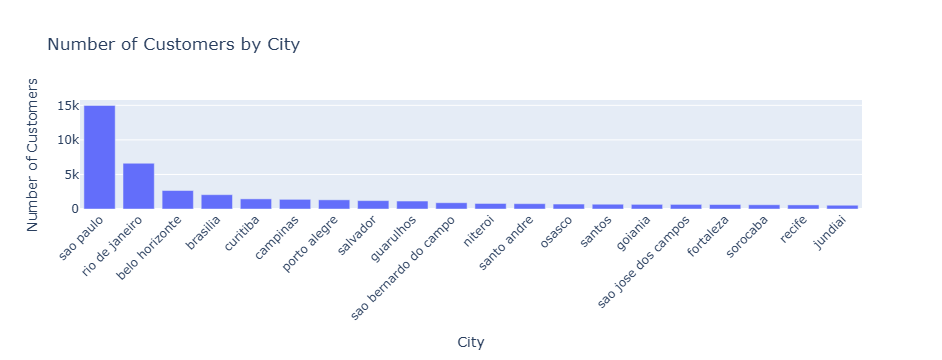

In [56]:
import plotly.express as px

fig = px.bar(
    x=customer_location_top20.index,
    y=customer_location_top20.values,
    title="Number of Customers by City",
    labels={"x": "City", "y": "Number of Customers"}
)

fig.update_layout(xaxis_tickangle=-45)

fig.show()

In [58]:
top20_customer_locations = customer_location_top20.index
top20_customer_locations

Index(['sao paulo', 'rio de janeiro', 'belo horizonte', 'brasilia', 'curitiba',
       'campinas', 'porto alegre', 'salvador', 'guarulhos',
       'sao bernardo do campo', 'niteroi', 'santo andre', 'osasco', 'santos',
       'goiania', 'sao jose dos campos', 'fortaleza', 'sorocaba', 'recife',
       'jundiai'],
      dtype='object', name='customer_city')

In [59]:
for index, location in enumerate(top20_customer_locations) :
    print("TOP", index + 1, location)

TOP 1 sao paulo
TOP 2 rio de janeiro
TOP 3 belo horizonte
TOP 4 brasilia
TOP 5 curitiba
TOP 6 campinas
TOP 7 porto alegre
TOP 8 salvador
TOP 9 guarulhos
TOP 10 sao bernardo do campo
TOP 11 niteroi
TOP 12 santo andre
TOP 13 osasco
TOP 14 santos
TOP 15 goiania
TOP 16 sao jose dos campos
TOP 17 fortaleza
TOP 18 sorocaba
TOP 19 recife
TOP 20 jundiai


In [73]:
# 3. 고객은 주로 어떤 결제방법을 사용할까? credit_card 76,505

In [15]:
payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [16]:
payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [17]:
payments.isnull().sum()

order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

In [18]:
payments["payment_type"].unique()

array(['credit_card', 'boleto', 'voucher', 'debit_card', 'not_defined'],
      dtype=object)

In [5]:
payments = payments[payments["payment_type"] != 'not_defined']

In [6]:
payments["payment_type"].unique()

array(['credit_card', 'boleto', 'voucher', 'debit_card'], dtype=object)

In [7]:
payment_type_count = payments.groupby("payment_type")["order_id"].nunique().sort_values(ascending=False)
payment_type_count

payment_type
credit_card    76505
boleto         19784
voucher         3866
debit_card      1528
Name: order_id, dtype: int64

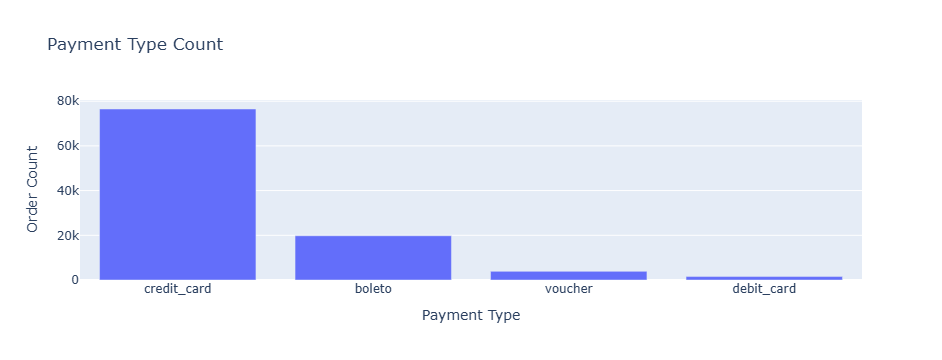

In [8]:
import plotly.express as px

fig = px.bar(
    x=payment_type_count.index,
    y=payment_type_count.values,
    title="Payment Type Count",
    labels= {"x": "Payment Type", "y": "Order Count"}
)

fig.show()

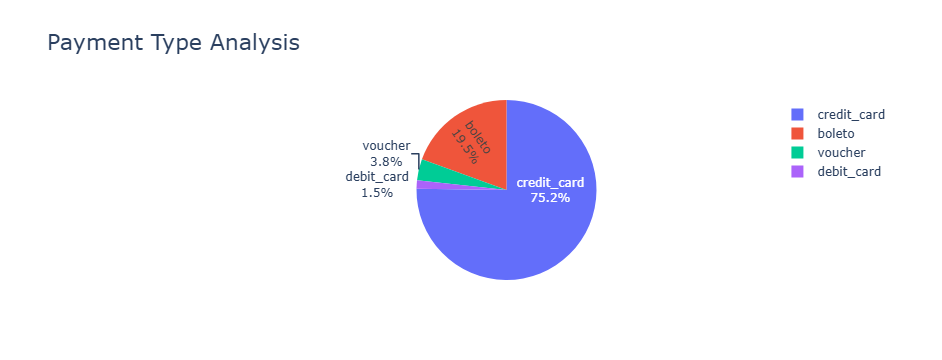

In [23]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Pie(
        labels=payment_type_count.index,
        values=payment_type_count.values,
        textinfo="label+percent",
        insidetextorientation="radial"
    )
)

fig.update_layout(
    {
        "title": {
            "text":"Payment Type Analysis",
            "font": {
                "size": 22
            }
        }
    }
)

fig.show()

In [81]:
# 4. 월 평균 거래금액은 얼마일까?

In [24]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [25]:
payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [26]:
order_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [27]:
order_items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [28]:
orders.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [29]:
orders = orders.dropna()

In [30]:
orders.isnull().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
dtype: int64

In [31]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96461 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       96461 non-null  object
 1   customer_id                    96461 non-null  object
 2   order_status                   96461 non-null  object
 3   order_purchase_timestamp       96461 non-null  object
 4   order_approved_at              96461 non-null  object
 5   order_delivered_carrier_date   96461 non-null  object
 6   order_delivered_customer_date  96461 non-null  object
 7   order_estimated_delivery_date  96461 non-null  object
dtypes: object(8)
memory usage: 6.6+ MB


In [32]:
payments.info()

<class 'pandas.core.frame.DataFrame'>
Index: 103883 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103883 non-null  object 
 1   payment_sequential    103883 non-null  int64  
 2   payment_type          103883 non-null  object 
 3   payment_installments  103883 non-null  int64  
 4   payment_value         103883 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.8+ MB


In [33]:
orders["order_id"].value_counts().max()

1

In [34]:
payments["order_id"].value_counts()

order_id
fa65dad1b0e818e3ccc5cb0e39231352    29
ccf804e764ed5650cd8759557269dc13    26
285c2e15bebd4ac83635ccc563dc71f4    22
895ab968e7bb0d5659d16cd74cd1650c    21
fedcd9f7ccdc8cba3a18defedd1a5547    19
                                    ..
4b186efcda6f283e9c4a71332f6d3ad0     1
c11717d999ffc510a6441df946f0a94d     1
f593228a7a25e9633ff78a4ce0d0d4cc     1
387c2c33e495538e94878a500bf8e6d5     1
298fcdf1f73eb413e4d26d01b25bc1cd     1
Name: count, Length: 99437, dtype: int64

In [9]:
payments[payments["order_id"] == "fa65dad1b0e818e3ccc5cb0e39231352"]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
4885,fa65dad1b0e818e3ccc5cb0e39231352,27,voucher,1,66.02
9985,fa65dad1b0e818e3ccc5cb0e39231352,4,voucher,1,29.16
14321,fa65dad1b0e818e3ccc5cb0e39231352,1,voucher,1,3.71
17274,fa65dad1b0e818e3ccc5cb0e39231352,9,voucher,1,1.08
19565,fa65dad1b0e818e3ccc5cb0e39231352,10,voucher,1,12.86
23074,fa65dad1b0e818e3ccc5cb0e39231352,2,voucher,1,8.51
24879,fa65dad1b0e818e3ccc5cb0e39231352,25,voucher,1,3.68
28330,fa65dad1b0e818e3ccc5cb0e39231352,5,voucher,1,0.66
29648,fa65dad1b0e818e3ccc5cb0e39231352,6,voucher,1,5.02
32519,fa65dad1b0e818e3ccc5cb0e39231352,11,voucher,1,4.03


In [60]:
payments = payments.groupby("order_id").sum()

In [10]:
payments[payments.index == "fa65dad1b0e818e3ccc5cb0e39231352"]

,order_id,payment_sequential,payment_type,payment_installments,payment_value


In [38]:
payments.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99437 entries, 00010242fe8c5a6d1ba2dd792cb16214 to fffe41c64501cc87c801fd61db3f6244
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   payment_sequential    99437 non-null  int64  
 1   payment_type          99437 non-null  object 
 2   payment_installments  99437 non-null  int64  
 3   payment_value         99437 non-null  float64
dtypes: float64(1), int64(2), object(1)
memory usage: 3.8+ MB


In [61]:
# merged_order = pd.merge(orders, payments, on="order_id", how="left")
merged_order = pd.merge(orders, payments, on="order_id")

In [13]:
merged_order.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96460 entries, 0 to 96459
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   order_id                       96460 non-null  object 
 1   customer_id                    96460 non-null  object 
 2   order_status                   96460 non-null  object 
 3   order_purchase_timestamp       96460 non-null  object 
 4   order_approved_at              96460 non-null  object 
 5   order_delivered_carrier_date   96460 non-null  object 
 6   order_delivered_customer_date  96460 non-null  object 
 7   order_estimated_delivery_date  96460 non-null  object 
 8   payment_sequential             96460 non-null  int64  
 9   payment_type                   96460 non-null  object 
 10  payment_installments           96460 non-null  int64  
 11  payment_value                  96460 non-null  float64
dtypes: float64(1), int64(2), object(9)
memory usag

In [14]:
merged_order

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,6,credit_cardvouchervoucher,3,38.71
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1,boleto,1,141.46
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1,credit_card,3,179.12
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,1,credit_card,1,72.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,1,credit_card,1,28.62
...,...,...,...,...,...,...,...,...,...,...,...,...
96455,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00,1,credit_card,3,85.08
96456,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00,1,credit_card,3,195.00
96457,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00,1,credit_card,5,271.01
96458,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00,1,credit_card,4,441.16


In [62]:
merged_order[merged_order["order_id"] == "e481f51cbdc54678b7cc49136f2d6af7"]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,6,credit_cardvouchervoucher,3,38.71


In [ ]:
# 현 데이터에서는 날짜가 특정한 기준에 따라 월별 정리되지 않은 상황
# 특정 월별 집합
# pandas는 날짜와 관련 타입 정의 => 날짜타입을 사용할 수만 있다면, 해당 타입에서 쓸 수 있는 함수, 속성 => 특정 월별 집합

In [16]:
merged_order.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96460 entries, 0 to 96459
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   order_id                       96460 non-null  object 
 1   customer_id                    96460 non-null  object 
 2   order_status                   96460 non-null  object 
 3   order_purchase_timestamp       96460 non-null  object 
 4   order_approved_at              96460 non-null  object 
 5   order_delivered_carrier_date   96460 non-null  object 
 6   order_delivered_customer_date  96460 non-null  object 
 7   order_estimated_delivery_date  96460 non-null  object 
 8   payment_sequential             96460 non-null  int64  
 9   payment_type                   96460 non-null  object 
 10  payment_installments           96460 non-null  int64  
 11  payment_value                  96460 non-null  float64
dtypes: float64(1), int64(2), object(9)
memory usag

In [63]:
import pandas as pd

df = pd.DataFrame({"order": ["2020-01-01 07:10:00",
                             "2020-01-08 07:20:00",
                             "2020-02-20 11:20:00",
                             "2020-02-20 04:40:50",
                             "2020-02-28 12:10:20",
                             "2019-01-10 17:23:50",
                             "2019-06-20 22:27:50"]})

In [20]:
df

,order
0,2020-01-01 07:10:00
1,2020-01-08 07:20:00
2,2020-02-20 11:20:00
3,2020-02-20 04:40:50
4,2020-02-28 12:10:20
5,2019-01-10 17:23:50
6,2019-06-20 22:27:50


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   order   7 non-null      object
dtypes: object(1)
memory usage: 188.0+ bytes


In [ ]:
# 문자열(object) 형태의 데이터 타입 -> 시간 타입 (datetime64)
# 2025-01-06 = 25-01-06 = 25-1-16 = 25-1-6
# time25"01'01' twenty,,,,,
# to_datetime(Series 변수 = order, format=, errors=)
# ignore : 무시, raise : 출력, coerce : NaT 결측치 값으로 변경 후 실행

%y : 연도를 축약해서 2자리로
%Y : 연도를 축약하지 않은 상태 4자리로
%m : 월을 2자리로
%d : 일을 2자리로
%H : 24시간을 기준 00~23
%M : 분을 2자리로
%S : 초를 2자리로

In [64]:
df["order"]= pd.to_datetime(df["order"], format="%Y-%m-%d %H:%M:%S", errors="raise")

In [22]:
df

,order
0,2020-01-01 07:10:00
1,2020-01-08 07:20:00
2,2020-02-20 11:20:00
3,2020-02-20 04:40:50
4,2020-02-28 12:10:20
5,2019-01-10 17:23:50
6,2019-06-20 22:27:50


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   order   7 non-null      datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 188.0 bytes


In [65]:
merged_order["order_purchase_timestamp"] = pd.to_datetime(merged_order["order_purchase_timestamp"], format="%Y-%m-%d %H:%M:%S", errors="raise")

In [25]:
merged_order.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96460 entries, 0 to 96459
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       96460 non-null  object        
 1   customer_id                    96460 non-null  object        
 2   order_status                   96460 non-null  object        
 3   order_purchase_timestamp       96460 non-null  datetime64[ns]
 4   order_approved_at              96460 non-null  object        
 5   order_delivered_carrier_date   96460 non-null  object        
 6   order_delivered_customer_date  96460 non-null  object        
 7   order_estimated_delivery_date  96460 non-null  object        
 8   payment_sequential             96460 non-null  int64         
 9   payment_type                   96460 non-null  object        
 10  payment_installments           96460 non-null  int64         
 11  payment_value  

In [69]:
merged_order_payment_date = merged_order[["order_purchase_timestamp", "payment_value"]].copy()

In [15]:
merged_order_payment_date.head()

,order_purchase_timestamp,payment_value
0,2017-10-02 10:56:33,18.12
1,2017-10-02 10:56:33,2.00
2,2017-10-02 10:56:33,18.59
3,2018-07-24 20:41:37,141.46
4,2018-08-08 08:38:49,179.12


In [46]:
merged_order_payment_date.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96460 entries, 0 to 96459
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   order_purchase_timestamp  96460 non-null  datetime64[ns]
 1   payment_value             96460 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.5 MB


In [67]:
merged_order_payment_date = merged_order_payment_date.set_index("order_purchase_timestamp")

In [32]:
merged_order_payment_date

,payment_value
order_purchase_timestamp,
2017-10-02 10:56:33,38.71
2018-07-24 20:41:37,141.46
2018-08-08 08:38:49,179.12
2017-11-18 19:28:06,72.20
2018-02-13 21:18:39,28.62
...,...
2017-03-09 09:54:05,85.08
2018-02-06 12:58:58,195.00
2017-08-27 14:46:43,271.01


In [ ]:
# 일별 나눠져있는 날짜 -> 월별
# groupby (중복해서 작성된 요소를 하나의 그룹 합칠 수 있음)

In [ ]:
# groupby > Grouper (*세부적으로 그룹의 조건 생성 적용)
# 데이터프레임.groupby(pd.Grouper(key="그룹화를 하려고하는 컬럼명", freq="세부기준"))

ME : 월간
QE : 분기
YE : 연간
D : 일일
h : 시간
min : 분당
s : 초당

In [70]:
merged_order_month_sum = merged_order_payment_date.groupby(pd.Grouper(key="order_purchase_timestamp", freq="ME")).sum()

In [ ]:
merged_order_month_sum

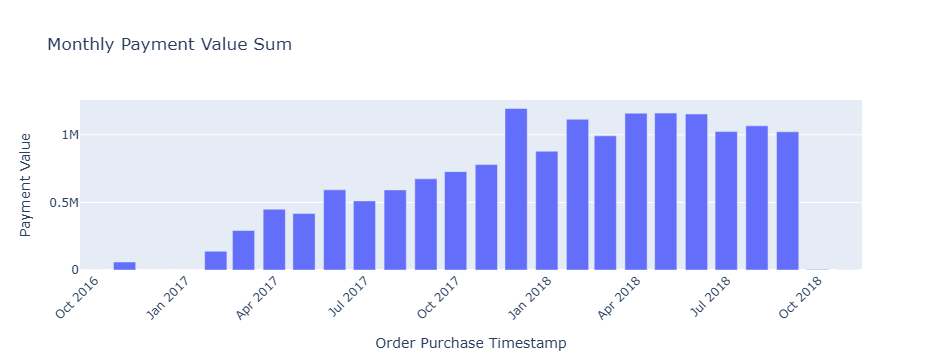

In [71]:
import plotly.express as px

fig = px.bar(
    x=merged_order_month_sum.index,
    y=merged_order_month_sum["payment_value"],
    title="Monthly Payment Value Sum",
    labels={
        "x": "Order Purchase Timestamp",
        "y": "Payment Value"
    }
)

fig.update_layout(xaxis_tickangle=-45)

fig.show()

In [56]:
merged_order_month_sum["payment_value"].mean()

np.float64(670420.9934782608)

In [57]:
merged_order_month_sum["payment_value"][3:]

order_purchase_timestamp
2017-01-31     127430.74
2017-02-28     269458.98
2017-03-31     414369.39
2017-04-30     390952.18
2017-05-31     566872.73
2017-06-30     490225.60
2017-07-31     566403.93
2017-08-31     646000.61
2017-09-30     700976.01
2017-10-31     751140.27
2017-11-30    1153393.22
2017-12-31     843199.17
2018-01-31    1078606.86
2018-02-28     966554.97
2018-03-31    1120678.00
2018-04-30    1132933.95
2018-05-31    1128836.69
2018-06-30    1011561.35
2018-07-31    1027383.10
2018-08-31     985414.28
Freq: ME, Name: payment_value, dtype: float64

In [58]:
merged_order_month_sum["payment_value"][3:].mean()

np.float64(768619.6014999999)

In [72]:
merged_order_month_sum[merged_order_month_sum["payment_value"] == merged_order_month_sum["payment_value"].max()]

,payment_value
order_purchase_timestamp,
2017-11-30,1194882.8


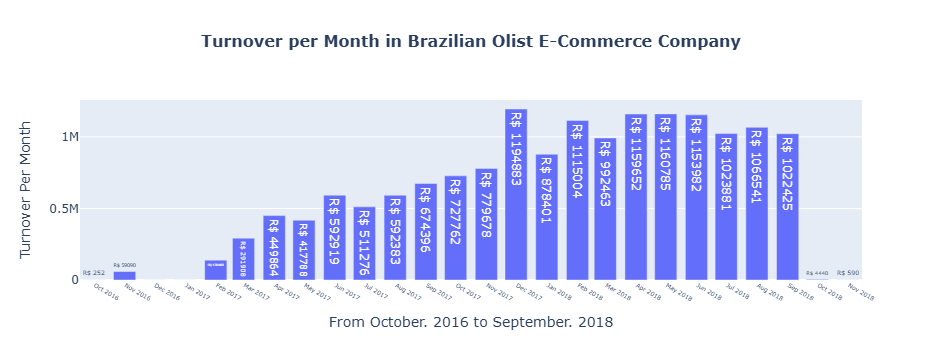

In [73]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=merged_order_month_sum.index,
        y=merged_order_month_sum["payment_value"],
        text=merged_order_month_sum["payment_value"],
        textposition="auto",
        texttemplate="R$ %{y:.0f}"
    )
)

fig.update_layout(
    {
        # "title": "<b>Turnover per Month in Brazilian Olist E-Commerce Company</b>"
        "title": {
            "text": "<b>Turnover per Month in Brazilian Olist E-Commerce Company</b>",
            "x": 0.5,
            "y": 0.9,
            "font": {
                "size": 16
            }
        },
        "xaxis": {
            "title": "From October. 2016 to September. 2018",
            "showticklabels": True,
            "dtick": "M1",
            "tickfont": {
                "size": 6
            }
        },
        "yaxis": {
            "title": "Turnover Per Month"
        }
    }
)

fig.show()

In [75]:
merged_order_month_sum_from2017 = merged_order_month_sum[merged_order_month_sum.index > "2017-01-01"]

In [62]:
merged_order_month_sum_from2017

,payment_value
order_purchase_timestamp,
2017-01-31,127430.74
2017-02-28,269458.98
2017-03-31,414369.39
2017-04-30,390952.18
2017-05-31,566872.73
2017-06-30,490225.60
2017-07-31,566403.93
2017-08-31,646000.61
2017-09-30,700976.01


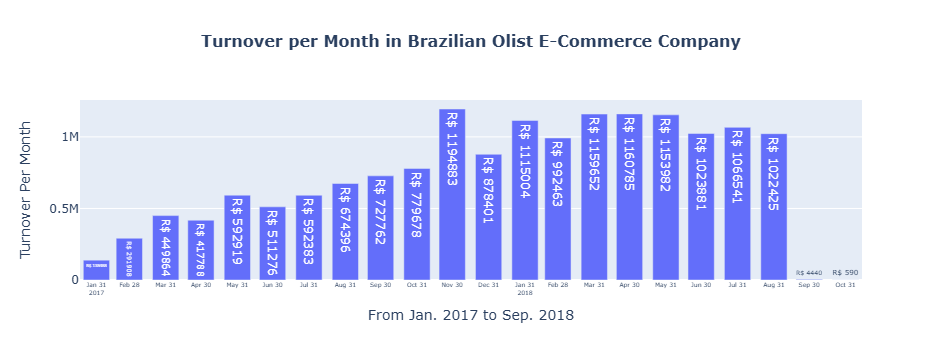

In [76]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=merged_order_month_sum_from2017.index,
        y=merged_order_month_sum_from2017["payment_value"],
        text=merged_order_month_sum["payment_value"],
        textposition="auto",
        texttemplate="R$ %{y:.0f}"
    )
)

fig.update_layout(
    {
        # "title": "<b>Turnover per Month in Brazilian Olist E-Commerce Company</b>"
        "title": {
            "text": "<b>Turnover per Month in Brazilian Olist E-Commerce Company</b>",
            "x": 0.5,
            "y": 0.9,
            "font": {
                "size": 16
            }
        },
        "xaxis": {
            "title": "From Jan. 2017 to Sep. 2018",
            "showticklabels": True,
            "tick0": "2017-01-31",
            "dtick": "M1",
            "tickfont": {
                "size": 6
            }
        },
        "yaxis": {
            "title": "Turnover Per Month"
        }
    }
)

fig.show()

In [77]:
import plotly.io as pio

pio.templates

Templates configuration
-----------------------
    Default template: 'plotly'
    Available templates:
        ['ggplot2', 'seaborn', 'simple_white', 'plotly',
         'plotly_white', 'plotly_dark', 'presentation', 'xgridoff',
         'ygridoff', 'gridon', 'none']

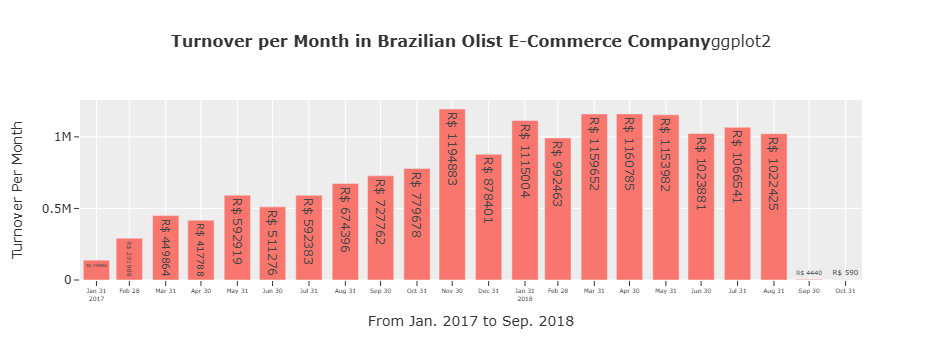

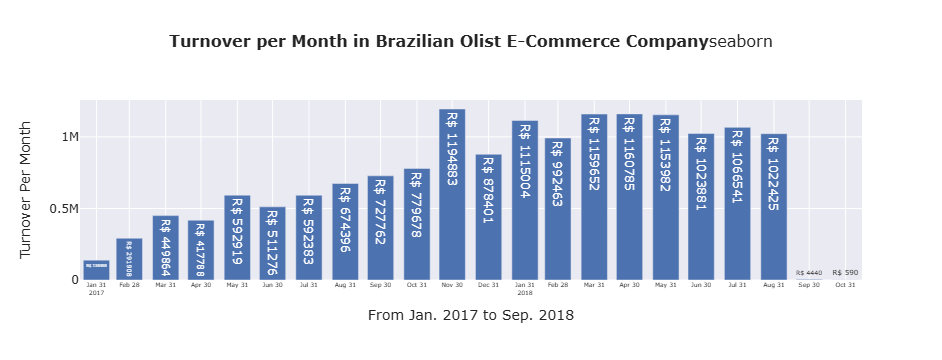

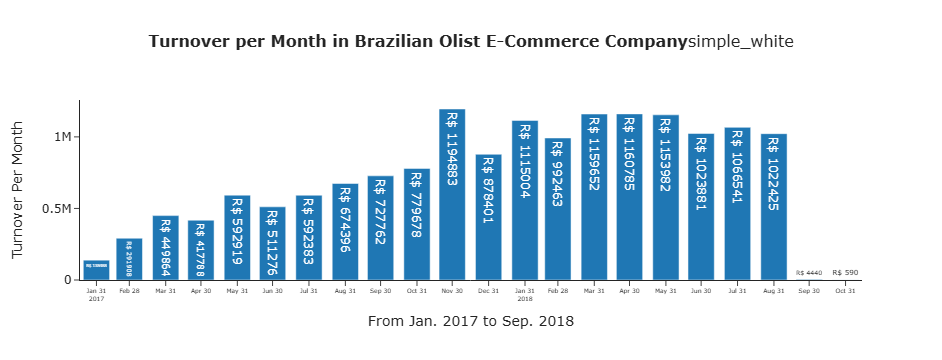

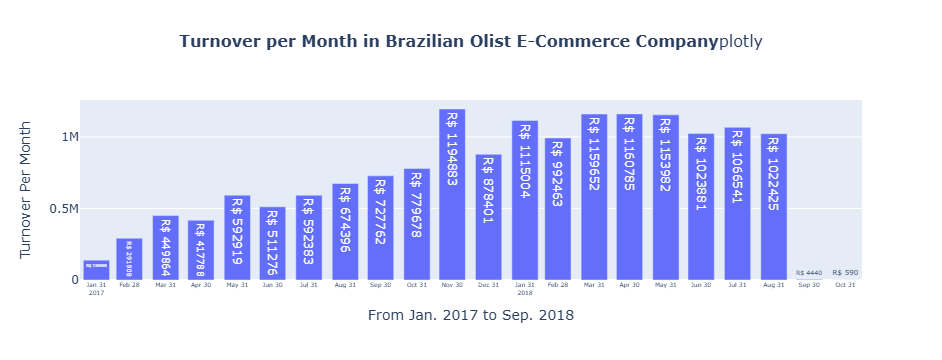

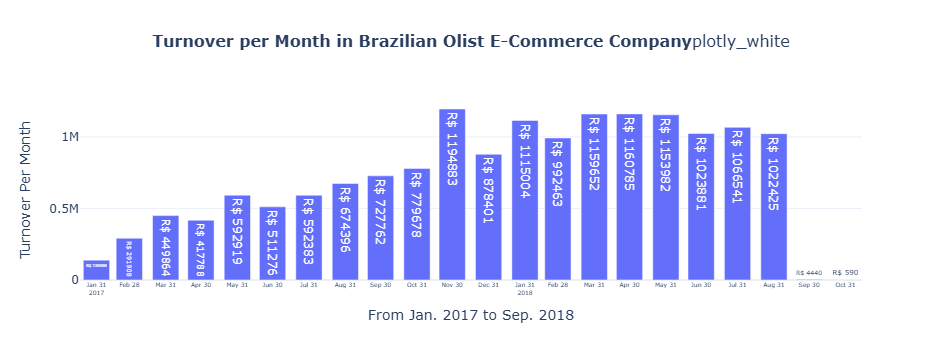

...

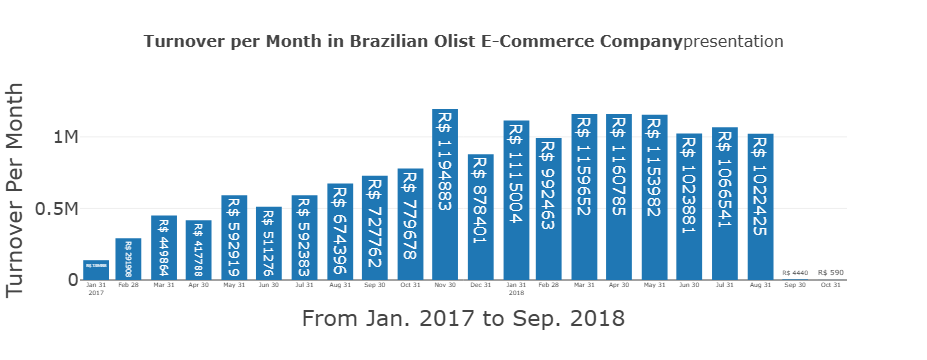

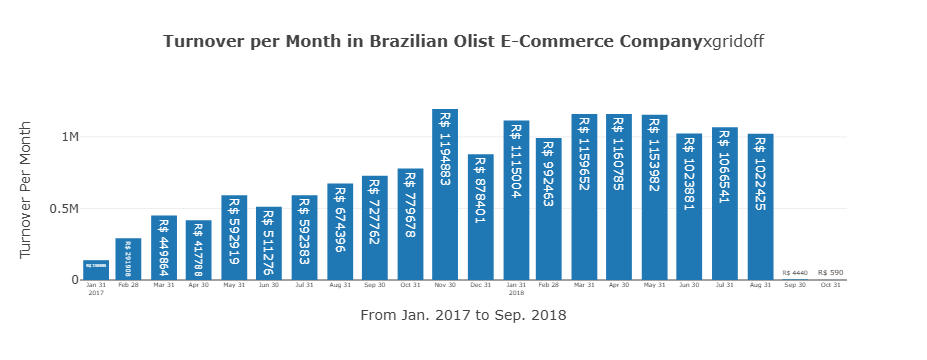

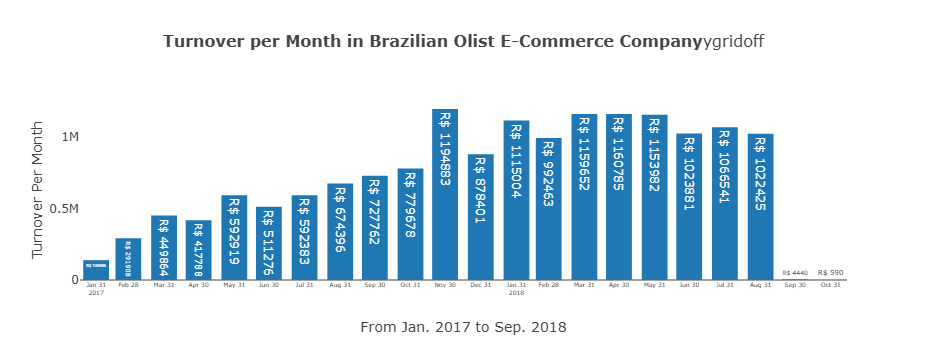

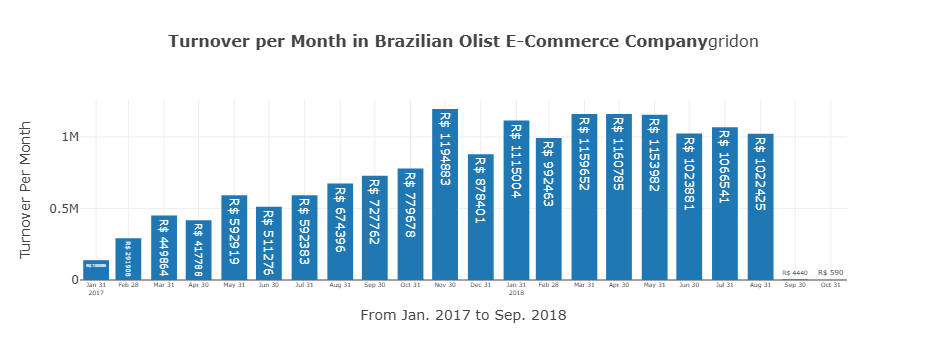

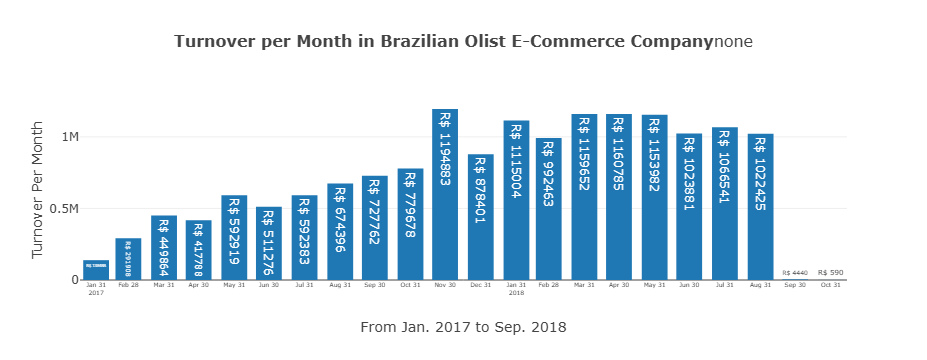

In [78]:
import plotly.graph_objects as go

for template in pio.templates :
    fig = go.Figure()
    
    fig.add_trace(
        go.Bar(
            x=merged_order_month_sum_from2017.index,
            y=merged_order_month_sum_from2017["payment_value"],
            text=merged_order_month_sum["payment_value"],
            textposition="auto",
            texttemplate="R$ %{y:.0f}"
        )
    )
    
    fig.update_layout(
        {
            # "title": "<b>Turnover per Month in Brazilian Olist E-Commerce Company</b>"
            "title": {
                "text": "<b>Turnover per Month in Brazilian Olist E-Commerce Company</b>" + template,
                "x": 0.5,
                "y": 0.9,
                "font": {
                    "size": 16
                }
            },
            "xaxis": {
                "title": "From Jan. 2017 to Sep. 2018",
                "showticklabels": True,
                "tick0": "2017-01-31",
                "dtick": "M1",
                "tickfont": {
                    "size": 6
                }
            },
            "yaxis": {
                "title": "Turnover Per Month"
            },
            "template": template
        }
    )
    
    fig.show()

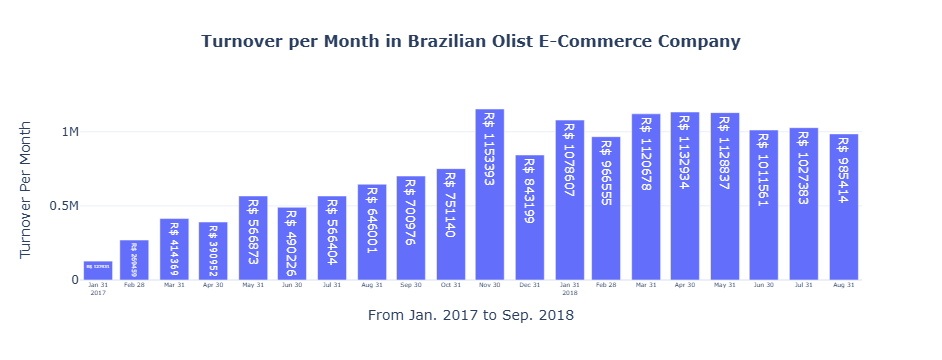

In [66]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=merged_order_month_sum_from2017.index,
        y=merged_order_month_sum_from2017["payment_value"],
        text=merged_order_month_sum["payment_value"],
        textposition="auto",
        texttemplate="R$ %{y:.0f}"
    )
)

fig.update_layout(
    {
        # "title": "<b>Turnover per Month in Brazilian Olist E-Commerce Company</b>"
        "title": {
            "text": "<b>Turnover per Month in Brazilian Olist E-Commerce Company</b>",
            "x": 0.5,
            "y": 0.9,
            "font": {
                "size": 16
            }
        },
        "xaxis": {
            "title": "From Jan. 2017 to Sep. 2018",
            "showticklabels": True,
            "tick0": "2017-01-31",
            "dtick": "M1",
            "tickfont": {
                "size": 6
            }
        },
        "yaxis": {
            "title": "Turnover Per Month"
        },
        "template": "plotly_white"
    }
)

fig.show()

In [67]:
colors = ["#03588c"] * len(merged_order_month_sum_from2017.index)
colors[10] = "#f24472"
colors

['#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#f24472',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c',
 '#03588c']

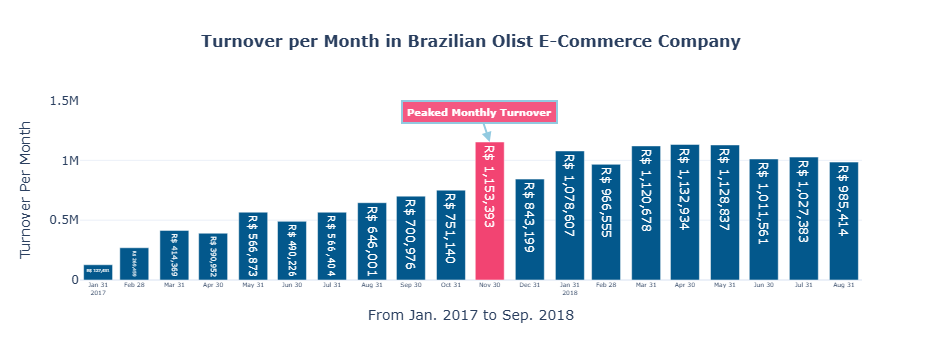

In [68]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=merged_order_month_sum_from2017.index,
        y=merged_order_month_sum_from2017["payment_value"],
        text=merged_order_month_sum["payment_value"],
        textposition="auto",
        texttemplate="R$ %{y:,.0f}",
        marker_color=colors
    )
)

fig.update_layout(
    {
        # "title": "<b>Turnover per Month in Brazilian Olist E-Commerce Company</b>"
        "title": {
            "text": "<b>Turnover per Month in Brazilian Olist E-Commerce Company</b>",
            "x": 0.5,
            "y": 0.9,
            "font": {
                "size": 16
            }
        },
        "xaxis": {
            "title": "From Jan. 2017 to Sep. 2018",
            "showticklabels": True,
            "tick0": "2017-01-31",
            "dtick": "M1",
            "tickfont": {
                "size": 6
            }
        },
        "yaxis": {
            "title": "Turnover Per Month"
        },
        "template": "plotly_white"
    }
)

fig.add_annotation(
    x="2017-11-30",
    y=1153393,
    text="<b>Peaked Monthly Turnover</b>",
    # font={
    #     "size":10
    # },
    font=dict(size=10, color="#fff"),
    bgcolor="#f22e62",
    bordercolor="#77bdd9",
    borderwidth=2,
    borderpad=4,
    opacity=0.8,
    showarrow=True,
    arrowhead=2,
    arrowsize=1,
    arrowwidth=2,
    arrowcolor="#77bdd9",
)

fig.show()

In [79]:
merged_order_date_sum = merged_order_payment_date.groupby(pd.Grouper(key="order_purchase_timestamp", freq="D")).sum()

In [70]:
merged_order_date_sum

,payment_value
order_purchase_timestamp,
2016-10-03,595.14
2016-10-04,9821.42
2016-10-05,7209.50
2016-10-06,6733.52
2016-10-07,7096.69
...,...
2018-08-25,11737.76
2018-08-26,9304.00
2018-08-27,6111.60


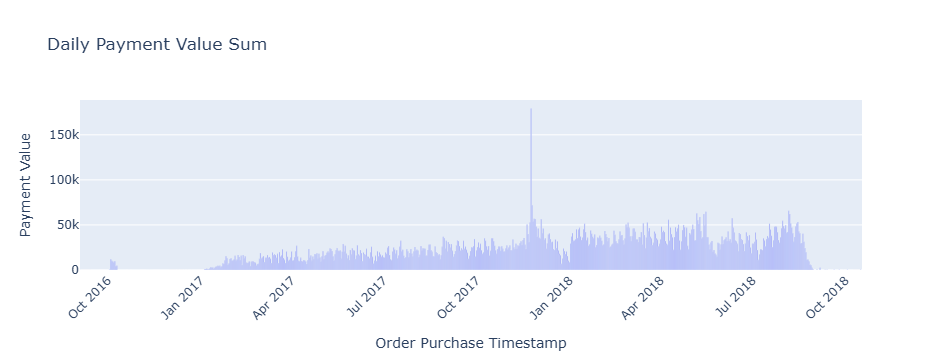

In [80]:
import plotly.express as px

fig = px.bar(
    x=merged_order_date_sum.index,
    y=merged_order_date_sum["payment_value"],
    title="Daily Payment Value Sum",
    labels={
        "x": "Order Purchase Timestamp",
        "y": "Payment Value"
    }
)

fig.update_layout(
    xaxis_tickangle=-45
)

fig.show()

In [81]:
merged_order_payment_date = merged_order[["order_purchase_timestamp", "payment_value"]].copy()

In [73]:
merged_order_payment_date.head()

,order_purchase_timestamp,payment_value
0,2017-10-02 10:56:33,38.71
1,2018-07-24 20:41:37,141.46
2,2018-08-08 08:38:49,179.12
3,2017-11-18 19:28:06,72.20
4,2018-02-13 21:18:39,28.62


In [123]:
merged_order_payment_date.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96460 entries, 0 to 96459
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   order_purchase_timestamp  96460 non-null  datetime64[ns]
 1   payment_value             96460 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.5 MB


In [82]:
dir(merged_order_payment_date["order_purchase_timestamp"].dt)

['__annotations__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__firstlineno__',
 '__format__',
 '__frozen',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__static_attributes__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_accessors',
 '_add_delegate_accessors',
 '_constructor',
 '_delegate_method',
 '_delegate_property_get',
 '_delegate_property_set',
 '_dir_additions',
 '_dir_deletions',
 '_freeze',
 '_get_values',
 '_hidden_attrs',
 '_parent',
 '_reset_cache',
 'as_unit',
 'ceil',
 'date',
 'day',
 'day_name',
 'day_of_week',
 'day_of_year',
 'dayofweek',
 'dayofyear',
 'days_in_month',
 'daysinmonth',
 'floor',
 'freq',
 'hour',
 'is_leap_year',
 'is_month_end',
 'is_month_start',
 'is_quarter_end',
 'is_quarter_start',
 'is_year_end',
 'is

In [75]:
merged_order_payment_date["order_purchase_timestamp"].dt.quarter

0        4
1        3
2        3
3        4
4        1
        ..
96455    1
96456    1
96457    3
96458    1
96459    1
Name: order_purchase_timestamp, Length: 96460, dtype: int32

In [83]:
merged_order_payment_date["year"] = merged_order_payment_date["order_purchase_timestamp"].dt.year
merged_order_payment_date["month"] = merged_order_payment_date["order_purchase_timestamp"].dt.month
merged_order_payment_date["day"] = merged_order_payment_date["order_purchase_timestamp"].dt.day
merged_order_payment_date["weekday"] = merged_order_payment_date["order_purchase_timestamp"].dt.weekday
merged_order_payment_date["hour"] = merged_order_payment_date["order_purchase_timestamp"].dt.hour
merged_order_payment_date["minute"] = merged_order_payment_date["order_purchase_timestamp"].dt.minute
merged_order_payment_date["quarter"] = merged_order_payment_date["order_purchase_timestamp"].dt.quarter

In [77]:
merged_order_payment_date.head()

,order_purchase_timestamp,payment_value,year,month,day,weekday,hour,minute,quarter
0,2017-10-02 10:56:33,38.71,2017,10,2,0,10,56,4
1,2018-07-24 20:41:37,141.46,2018,7,24,1,20,41,3
2,2018-08-08 08:38:49,179.12,2018,8,8,2,8,38,3
3,2017-11-18 19:28:06,72.20,2017,11,18,5,19,28,4
4,2018-02-13 21:18:39,28.62,2018,2,13,1,21,18,1


In [84]:
merged_order_payment_year = merged_order_payment_date[["year", "payment_value"]].copy()

In [142]:
merged_order_payment_year

,year,payment_value
0,2017,38.71
1,2018,141.46
2,2018,179.12
3,2017,72.20
4,2018,28.62
...,...,...
96455,2017,85.08
96456,2018,195.00
96457,2017,271.01
96458,2018,441.16


In [85]:
merged_order_payment_year = merged_order_payment_year.groupby("year").sum()

In [144]:
merged_order_payment_year

,payment_value
year,
2016,47290.82
2017,6920422.83
2018,8451969.20


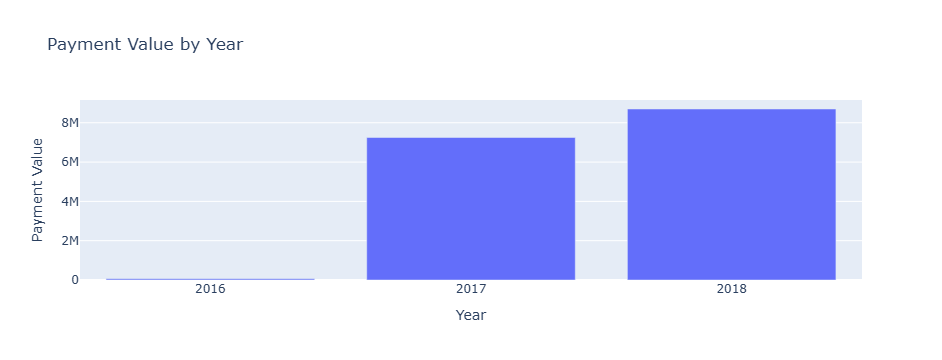

In [86]:
import plotly.express as px

fig = px.bar(
    x=merged_order_payment_year.index,
    y=merged_order_payment_year["payment_value"],
    title="Payment Value by Year",
    labels={
        "x": "Year",
        "y": "Payment Value"
    }
)

fig.update_xaxes(tickvals=[2016, 2017, 2018])

fig.show()

In [87]:
merged_order_payment_weekday = merged_order_payment_date[["weekday", "payment_value"]].copy()

In [161]:
merged_order_payment_weekday

,weekday,payment_value
0,0,38.71
1,1,141.46
2,2,179.12
3,5,72.20
4,1,28.62
...,...,...
96455,3,85.08
96456,1,195.00
96457,6,271.01
96458,0,441.16


In [94]:
merged_order_payment_weekday = merged_order_payment_weekday.groupby("weekday").sum()

In [100]:
merged_order_payment_weekday.head()

,payment_value
weekday,
0,2530671.56
1,2473930.77
2,2396215.34
3,2283849.51
4,2222421.36


In [91]:
def func(row) :
    if row["weekday"] == 0 :
        row["weekday"] = "Mon"
    elif row["weekday"] == 1 :
        row["weekday"] = "Tue"
    elif row["weekday"] == 2 :
        row["weekday"] = "Wed"
    elif row["weekday"] == 3 :
        row["weekday"] = "Thu"
    elif row["weekday"] == 4 :
        row["weekday"] = "Fri"
    elif row["weekday"] == 5 :
        row["weekday"] = "Sat"
    elif row["weekday"] == 6 :
        row["weekday"] = "Sun"
    return row

In [92]:
merged_order_payment_weekday.index

Index([0, 1, 2, 3, 4, 5, 6], dtype='int32', name='weekday')

In [95]:
merged_order_payment_weekday["weekday"] = merged_order_payment_weekday["weekday"].astype(object)
merged_order_payment_weekday = merged_order_payment_weekday.apply(func, axis=1)
merged_order_payment_weekday

KeyError: 'weekday'

In [164]:
merged_order_payment_weekday["weekday"]

0        0
1        1
2        2
3        5
4        1
        ..
96455    3
96456    1
96457    6
96458    0
96459    3
Name: weekday, Length: 96460, dtype: object

In [103]:
merged_order_payment_weekday = merged_order_payment_weekday.groupby("weekday").sum()

In [167]:
merged_order_payment_weekday

,payment_value
weekday,
Fri,2222421.36
Mon,2530671.56
Sat,1704949.69
Sun,1807644.62
Thu,2283849.51
Tue,2473930.77
Wed,2396215.34


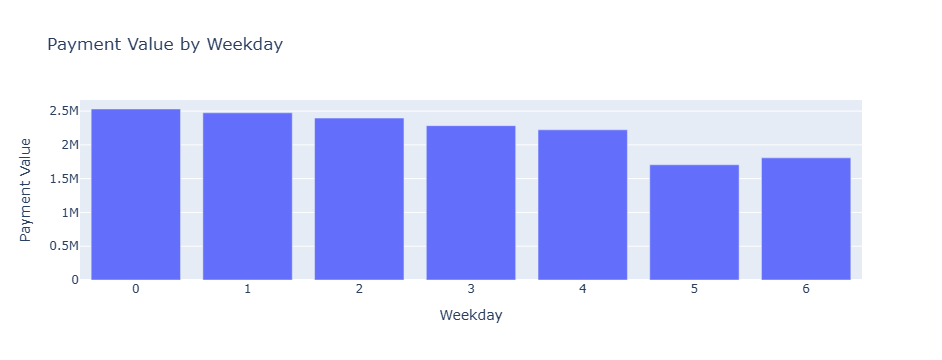

In [104]:
import plotly.express as px

fig = px.bar(
    x=merged_order_payment_weekday.index,
    y=merged_order_payment_weekday["payment_value"],
    category_orders={"x": ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]},
    title="Payment Value by Weekday",
    labels={"x": "Weekday", "y": "Payment Value"}
)

fig.show()

In [96]:
merged_order_payment_quarter = merged_order_payment_date[["quarter", "payment_value"]].copy()

In [186]:
merged_order_payment_quarter

,quarter,payment_value
0,4,38.71
1,3,141.46
2,3,179.12
3,4,72.20
4,1,28.62
...,...,...
96455,1,85.08
96456,1,195.00
96457,3,271.01
96458,1,441.16


In [97]:
merged_order_payment_quarter = merged_order_payment_quarter.groupby("quarter", as_index=False).sum()

In [188]:
merged_order_payment_quarter

,quarter,payment_value
0,1,3977098.94
1,2,4721382.50
2,3,3926177.93
3,4,2795023.48


In [180]:
merged_order_payment_quarter.reset_index()

,quarter,payment_value
0,1,3977098.94
1,2,4721382.50
2,3,3926177.93
3,4,2795023.48


In [98]:
def func(row) :
    if row["quarter"] == 1 :
        row["quarter"] = "1Q"
    elif row["quarter"] == 2 :
        row["quarter"] = "2Q"
    elif row["quarter"] == 3 :
        row["quarter"] = "3Q"
    elif row["quarter"] == 4 :
        row["quarter"] = "4Q"
    return row

In [99]:
merged_order_payment_quarter["quarter"] = merged_order_payment_quarter["quarter"].astype(object)
merged_order_payment_quarter = merged_order_payment_quarter.apply(func, axis=1)
merged_order_payment_quarter

,quarter,payment_value
0,1Q,4147379.29
1,2Q,4860631.36
2,3Q,4088199.54
3,4Q,2912661.93


In [100]:
merged_order_payment_quarter = merged_order_payment_quarter.set_index("quarter")

In [192]:
merged_order_payment_quarter

,payment_value
quarter,
1Q,3977098.94
2Q,4721382.50
3Q,3926177.93
4Q,2795023.48


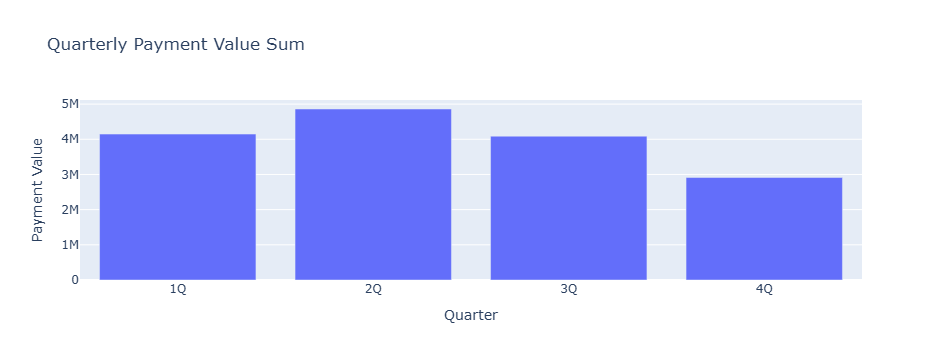

In [101]:
import plotly.express as px

fig = px.bar(
    x = merged_order_payment_quarter.index,
    y = merged_order_payment_quarter["payment_value"],
    title = "Quarterly Payment Value Sum",
    labels={"x": "Quarter", "y": "Payment Value"}
)

fig.show()

In [102]:
merged_order_payment_hour = merged_order_payment_date[["hour", "payment_value"]].copy()

In [103]:
merged_order_payment_hour = merged_order_payment_hour.groupby("hour").sum()

In [201]:
merged_order_payment_hour

,payment_value
hour,
0,360158.45
1,171441.04
2,64572.21
3,37551.29
4,28209.97
5,25620.74
6,63215.01
7,173948.18
8,452343.96


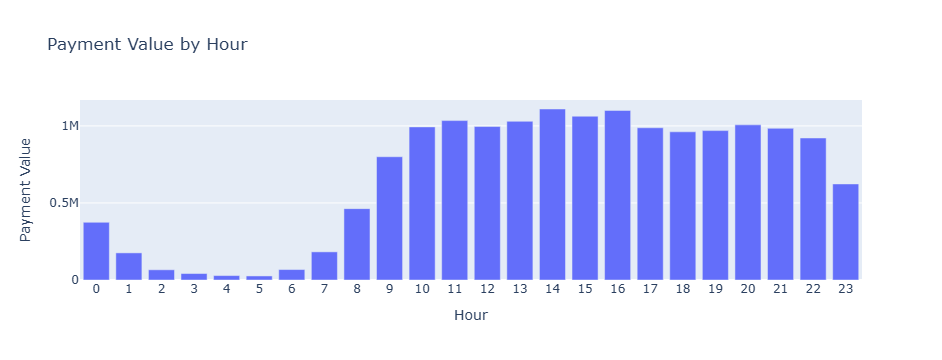

In [104]:
import plotly.express as px

fig = px.bar(
    x=merged_order_payment_hour.index,
    y=merged_order_payment_hour["payment_value"],
    title="Payment Value by Hour",
    labels={"x": "Hour", "y": "Payment Value"}
)

fig.update_layout(
    xaxis={
        "dtick": 1
    }
)

fig.show()

In [105]:
merged_order_payment_minute = merged_order_payment_date[["minute", "payment_value"]].copy()

In [106]:
merged_order_payment_minute = merged_order_payment_minute.groupby("minute").sum()

In [209]:
merged_order_payment_minute

,payment_value
minute,
0,253410.99
1,247286.12
2,220971.41
3,245626.28
4,265087.98
5,259540.04
6,257488.36
7,267940.45
8,271719.60


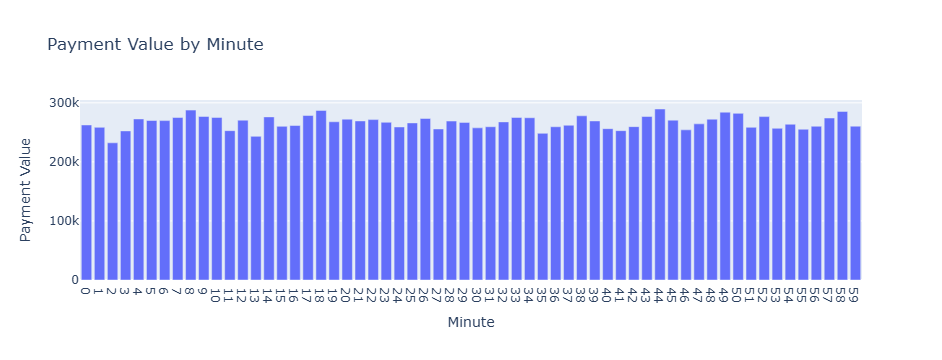

In [107]:
import plotly.express as px

fig = px.bar(
    x=merged_order_payment_minute.index,
    y=merged_order_payment_minute["payment_value"],
    title="Payment Value by Minute",
    labels={"x": "Minute", "y": "Payment Value"}
)

fig.update_layout(
    xaxis={
        "dtick": 1
    }
)

fig.show()

In [211]:
merged_order_payment_date.head()

,order_purchase_timestamp,payment_value,year,month,weekday,hour,quarter,minute,day
0,2017-10-02 10:56:33,38.71,2017,10,0,10,4,56,2
1,2018-07-24 20:41:37,141.46,2018,7,1,20,3,41,24
2,2018-08-08 08:38:49,179.12,2018,8,2,8,3,38,8
3,2017-11-18 19:28:06,72.20,2017,11,5,19,4,28,18
4,2018-02-13 21:18:39,28.62,2018,2,1,21,1,18,13


In [108]:
merged_order_payment_hour_weekday = merged_order_payment_date[["weekday", "hour", "payment_value"]].copy()

In [213]:
merged_order_payment_hour_weekday

,weekday,hour,payment_value
0,0,10,38.71
1,1,20,141.46
2,2,8,179.12
3,5,19,72.20
4,1,21,28.62
...,...,...,...
96455,3,9,85.08
96456,1,12,195.00
96457,6,14,271.01
96458,0,21,441.16


In [112]:
merged_order_payment_hour_weekday = merged_order_payment_hour_weekday.groupby(["weekday", "hour"]).sum()

In [215]:
merged_order_payment_hour_weekday

payment_value
weekday hour               
0       0          46807.42
        1          17734.77
        2           7462.56
        3           6442.62
        4           2138.02
...                     ...
6       19        140127.39
        20        150543.96
        21        135431.31
        22        127866.74
        23         82991.95

[168 rows x 1 columns]

In [116]:
merged_order_payment_hour_weekday = merged_order_payment_hour_weekday.reset_index()

In [118]:
def func(row) :
    if row["weekday"] == 0 :
        row["weekday"] = "Mon"
    elif row["weekday"] == 1 :
        row["weekday"] = "Tue"
    elif row["weekday"] == 2 :
        row["weekday"] = "Wed"
    elif row["weekday"] == 3 :
        row["weekday"] = "Thu"
    elif row["weekday"] == 4 :
        row["weekday"] = "Fri"
    elif row["weekday"] == 5 :
        row["weekday"] = "Sat"
    elif row["weekday"] == 6 :
        row["weekday"] = "Sun"
    return row

In [119]:
merged_order_payment_hour_weekday["weekday"] = merged_order_payment_hour_weekday["weekday"].astype(object)
merged_order_payment_hour_weekday = merged_order_payment_hour_weekday.apply(func, axis=1)
merged_order_payment_hour_weekday

,index,weekday,hour,payment_value
0,0,Mon,10,38.71
1,1,Tue,20,141.46
2,2,Wed,8,179.12
3,3,Sat,19,72.20
4,4,Tue,21,28.62
...,...,...,...,...
99432,99432,Thu,9,85.08
99433,99433,Tue,12,195.00
99434,99434,Sun,14,271.01
99435,99435,Mon,21,441.16


In [ ]:
# 요일 & 시간 간 거래액 관련 상관관계 파악

In [120]:
merged_order_payment_hour_weekday = merged_order_payment_date[["weekday", "hour", "payment_value"]].copy()

In [121]:
merged_order_payment_hour_weekday

,weekday,hour,payment_value
0,0,10,38.71
1,1,20,141.46
2,2,8,179.12
3,5,19,72.20
4,1,21,28.62
...,...,...,...
99432,3,9,85.08
99433,1,12,195.00
99434,6,14,271.01
99435,0,21,441.16


In [123]:
merged_order_payment_hour_weekday=merged_order_payment_hour_weekday.groupby(["weekday", "hour"]).sum()

In [124]:
merged_order_payment_hour_weekday

payment_value
weekday hour               
0       0          48632.14
        1          18102.83
        2           8007.15
        3           6848.70
        4           2138.02
...                     ...
6       19        144943.88
        20        155117.41
        21        139557.62
        22        130346.29
        23         88475.78

[168 rows x 1 columns]

In [125]:
merged_order_payment_hour_weekday.index[3][0]

np.int32(0)

In [127]:
merged_order_payment_hour_weekday=merged_order_payment_hour_weekday.reset_index()

In [128]:
merged_order_payment_hour_weekday

,weekday,hour,payment_value
0,0,0,48632.14
1,0,1,18102.83
2,0,2,8007.15
3,0,3,6848.70
4,0,4,2138.02
...,...,...,...
163,6,19,144943.88
164,6,20,155117.41
165,6,21,139557.62
166,6,22,130346.29


In [129]:
def func(row) :
    if row["weekday"] == 0 :
        row["weekday"] = "Mon"
    elif row["weekday"] == 1 :
        row["weekday"] = "Tue"
    elif row["weekday"] == 2 :
        row["weekday"] = "Wed"
    elif row["weekday"] == 3 :
        row["weekday"] = "Thu"
    elif row["weekday"] == 4 :
        row["weekday"] = "Fri"
    elif row["weekday"] == 5 :
        row["weekday"] = "Sat"
    elif row["weekday"] == 6 :
        row["weekday"] = "Sun"
        
    return row

In [130]:
merged_order_payment_hour_weekday.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168 entries, 0 to 167
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   weekday        168 non-null    int32  
 1   hour           168 non-null    int32  
 2   payment_value  168 non-null    float64
dtypes: float64(1), int32(2)
memory usage: 2.8 KB


In [131]:
merged_order_payment_hour_weekday["weekday"]=merged_order_payment_hour_weekday["weekday"].astype(object)
merged_order_payment_hour_weekday=merged_order_payment_hour_weekday.apply(func,axis=1)
merged_order_payment_hour_weekday

,weekday,hour,payment_value
0,Mon,0,48632.14
1,Mon,1,18102.83
2,Mon,2,8007.15
3,Mon,3,6848.70
4,Mon,4,2138.02
...,...,...,...
163,Sun,19,144943.88
164,Sun,20,155117.41
165,Sun,21,139557.62
166,Sun,22,130346.29


In [132]:
merged_order_payment_hour_weekday.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168 entries, 0 to 167
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   weekday        168 non-null    object 
 1   hour           168 non-null    int64  
 2   payment_value  168 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 4.1+ KB


In [134]:
merged_order_payment_hour_weekday["weekday"] = pd.Categorical(
    merged_order_payment_hour_weekday["weekday"],
    categories=["Sun", "Mon", "Tue", "Wed", "Thu", "Fri", "Sat"],
    ordered=True
)

In [135]:
merged_order_payment_hour_weekday=merged_order_payment_hour_weekday.sort_values(by=["weekday", "hour"], ascending=True)

In [136]:
merged_order_payment_hour_weekday

,weekday,hour,payment_value
144,Sun,0,42231.35
145,Sun,1,20820.00
146,Sun,2,12150.76
147,Sun,3,9457.71
148,Sun,4,3914.48
...,...,...,...
139,Sat,19,120610.35
140,Sat,20,127248.24
141,Sat,21,102593.72
142,Sat,22,82841.84


In [ ]:
#피어슨 상관계수 => 상관관계관련 데이터 차트를 생성

In [137]:
doc=pd.read_csv("COVID-19-master/csse_covid_19_data/csse_covid_19_daily_reports/04-01-2020.csv", encoding="utf-8-sig")

In [138]:
doc

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key
0,45001.0,Abbeville,South Carolina,US,2020-04-01 21:58:49,34.223334,-82.461707,4,0,0,4,"Abbeville, South Carolina, US"
1,22001.0,Acadia,Louisiana,US,2020-04-01 21:58:49,30.295065,-92.414197,47,1,0,46,"Acadia, Louisiana, US"
2,51001.0,Accomack,Virginia,US,2020-04-01 21:58:49,37.767072,-75.632346,7,0,0,7,"Accomack, Virginia, US"
3,16001.0,Ada,Idaho,US,2020-04-01 21:58:49,43.452658,-116.241552,195,3,0,192,"Ada, Idaho, US"
4,19001.0,Adair,Iowa,US,2020-04-01 21:58:49,41.330756,-94.471059,1,0,0,1,"Adair, Iowa, US"
...,...,...,...,...,...,...,...,...,...,...,...,...
2517,82604.0,NaN,Wales,United Kingdom,2020-04-01 21:58:49,52.130700,-3.783700,0,198,0,0,"Wales, United Kingdom"
2518,NaN,NaN,NaN,Nauru,2020-04-01 21:58:49,-0.522800,166.931500,0,0,0,0,Nauru
2519,NaN,NaN,Niue,New Zealand,2020-04-01 21:58:49,-19.054400,-169.867200,0,0,0,0,"Niue, New Zealand"
2520,NaN,NaN,NaN,Tuvalu,2020-04-01 21:58:49,-7.109500,177.649300,0,0,0,0,Tuvalu


In [141]:
doc2=doc.corr(numeric_only=True)

In [142]:
doc2

,FIPS,Lat,Long_,Confirmed,Deaths,Recovered,Active
FIPS,1.000000,0.160717,0.171490,-0.000504,0.076467,NaN,0.002718
Lat,0.160717,1.000000,-0.476426,0.029389,0.026309,-0.002781,0.035631
Long_,0.171490,-0.476426,1.000000,0.141126,0.096924,0.141932,0.119737
Confirmed,-0.000504,0.029389,0.141126,1.000000,0.837153,0.727305,0.942484
Deaths,0.076467,0.026309,0.096924,0.837153,1.000000,0.546858,0.796549
Recovered,NaN,-0.002781,0.141932,0.727305,0.546858,1.000000,0.462484
Active,0.002718,0.035631,0.119737,0.942484,0.796549,0.462484,1.000000


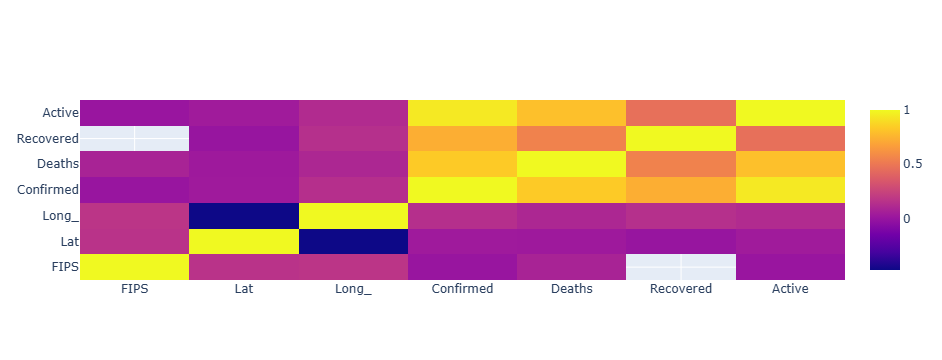

In [144]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Heatmap(
        x=doc2.columns,
        y=doc2.index,
        z=doc2.values
    )
)



fig.show()

In [146]:
pivot_df=merged_order_payment_hour_weekday.pivot(index="weekday", columns="hour", values="payment_value")

In [147]:
pivot_df

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Sun,42231.35,20820.00,12150.76,9457.71,3914.48,3605.57,4864.46,17854.90,35273.52,62963.56,...,113753.53,117506.49,105179.57,127328.17,138275.70,144943.88,155117.41,139557.62,130346.29,88475.78
Mon,48632.14,18102.83,8007.15,6848.70,2138.02,2915.84,7554.34,21839.84,75728.33,133717.71,...,182390.45,176517.74,175954.63,158050.35,147894.01,158628.50,167668.44,179942.31,170609.01,117355.51
Tue,48207.45,24007.65,9872.94,5766.02,4261.12,2484.91,9440.90,30433.23,74394.34,145074.68,...,187921.29,162929.88,176443.45,158300.41,141374.54,145684.83,166249.21,165564.83,156997.21,107477.77
Wed,65396.56,25958.21,10306.86,4443.78,3377.50,3150.76,11705.25,32359.82,83027.23,144428.34,...,178486.39,159620.54,177156.97,157780.54,158587.74,131257.76,136209.90,146214.68,131370.59,85202.43
Thu,57775.64,22298.39,10521.75,5400.55,4530.63,3153.73,9907.60,35456.98,80435.31,118814.50,...,154372.37,152104.33,172923.66,146707.76,133651.30,139903.51,138105.63,136447.33,139419.93,85846.51
Fri,67820.51,40519.12,7060.85,5663.93,5142.38,7655.93,14329.31,27021.58,75925.85,123502.10,...,165045.47,170390.53,179266.15,127291.37,125846.93,128446.29,116164.52,114083.69,110082.41,78736.50
Sat,44366.22,24262.22,8286.66,4333.35,5219.08,3249.49,9882.51,17641.24,38388.34,71381.07,...,127808.48,123946.27,113616.00,112367.62,116046.39,120610.35,127248.24,102593.72,82841.84,60263.32


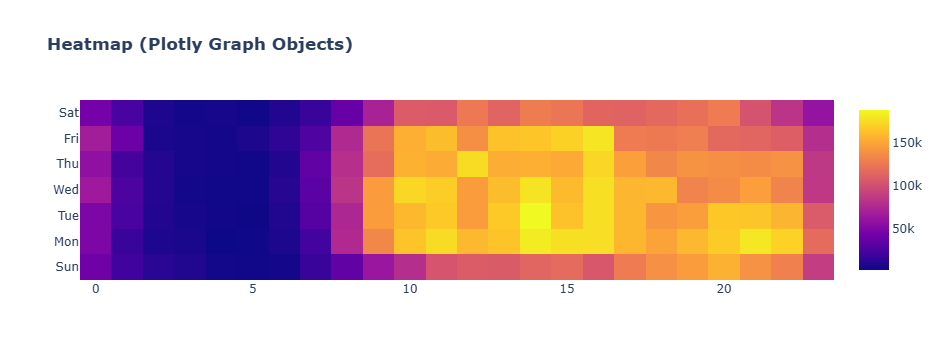

In [151]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Heatmap(
        x=pivot_df.columns,
        y=pivot_df.index,
        z=pivot_df.values
    )
)

fig.update_layout(
    {
        "title": "<b>Heatmap (Plotly Graph Objects)</b>"
        # "title": {
        #     "text": "<b>Heatmap (Plotly Graph Objects)</b>"
#             "x": 0.5,
#             "y": 0.9,
#             "font": {
#                 "size": 16
#             }
#         },
#         "xaxis": {
#             "title": "From Jan. 2017 to Sep. 2018",
#             "showticklabels": True,
#             "tick0": "2017-01-31",
#             "dtick": "M1",
#             "tickfont": {
#                 "size": 6
#             }
#         },
#         "yaxis": {
#             "title": "Turnover Per Month"
#         },
#         "template": "plotly_white"
    }
)


fig.show()

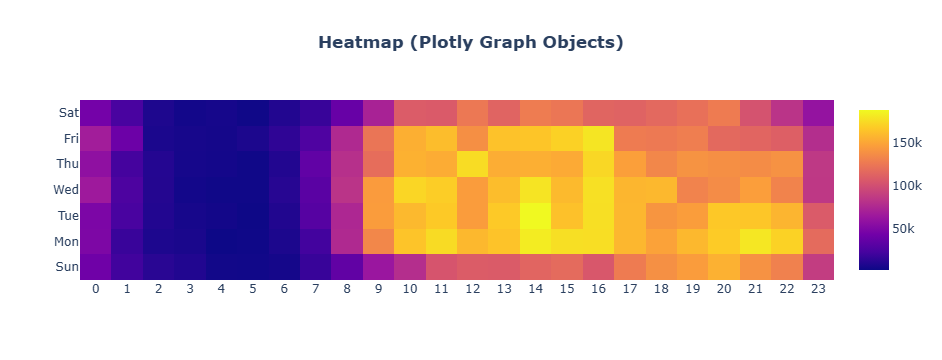

In [161]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Heatmap(
        x=pivot_df.columns,
        y=pivot_df.index,
        z=pivot_df.values,
        texttemplate="%{text}"
    )
)

fig.update_layout(
    {
        # "title": "<b>Heatmap (Plotly Graph Objects)</b>"
        "title": {
            "text": "<b>Heatmap (Plotly Graph Objects)</b>",
             "x": 0.5,
             "y": 0.9
        },
        "xaxis": {
             "dtick": "M1"
        }

    }
)


fig.show()

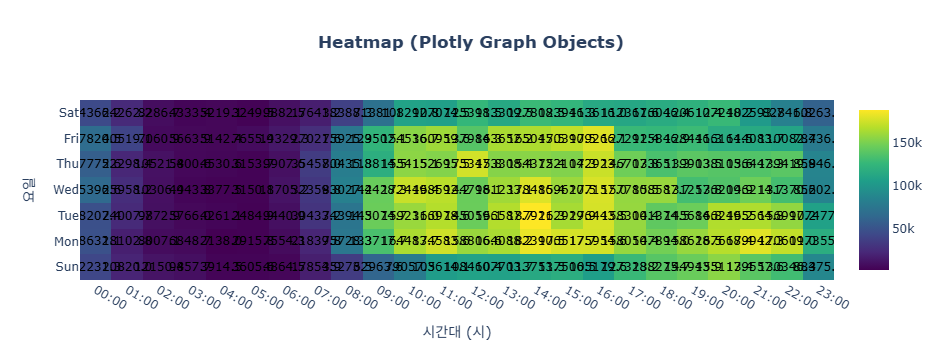

In [160]:
import plotly.graph_objects as go

# text_values 생성 (소수점 1자리 포맷 예시)
text_values = [[f"{val:.1f}" for val in row] for row in pivot_df.values]

fig = go.Figure()

fig.add_trace(
    go.Heatmap(
        x=pivot_df.columns,        # 예: 0~23 시간대
        y=pivot_df.index,          # 예: 요일 순서
        z=pivot_df.values,         # 히트맵에 사용할 값
        text=text_values,          # 셀 안에 들어갈 텍스트
        texttemplate="%{text}",    # 표시 포맷
        textfont={"size": 12, "color": "black"},
        colorscale='Viridis'
    )
)

fig.update_layout(
    title={
        "text": "<b>Heatmap (Plotly Graph Objects)</b>",
        "x": 0.5,
        "y": 0.9
    },
    xaxis=dict(
        title="시간대 (시)",
        tickmode='array',
        tickvals=list(pivot_df.columns),
        ticktext=[f"{int(col):02d}:00" for col in pivot_df.columns]
    ),
    yaxis=dict(
        title="요일"
    )
)

fig.show()


In [ ]:
# 어떤 카테고리가 가장 많은 매출을 발생시켰는가?

In [ ]:
products = pd.read_csv(f"{PATH}olist_products_dataset.csv", encoding="utf-8-sig")
customers = pd.read_csv(f"{PATH}olist_customers_dataset.csv", encoding="utf-8-sig")
geolocation = pd.read_csv(f"{PATH}olist_geolocation_dataset.csv", encoding="utf-8-sig")
order_items = pd.read_csv(f"{PATH}olist_order_items_dataset.csv", encoding="utf-8-sig")
payments = pd.read_csv(f"{PATH}olist_order_payments_dataset.csv", encoding="utf-8-sig")
reviews = pd.read_csv(f"{PATH}olist_order_reviews_dataset.csv", encoding="utf-8-sig")
orders = pd.read_csv(f"{PATH}olist_orders_dataset.csv", encoding="utf-8-sig")
sellers = pd.read_csv(f"{PATH}olist_sellers_dataset.csv", encoding="utf-8-sig")
category_name = pd.read_csv(f"{PATH}product_category_name_translation.csv", encoding="utf-8-sig")

In [162]:
category_name

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
...,...,...
66,flores,flowers
67,artes_e_artesanato,arts_and_craftmanship
68,fraldas_higiene,diapers_and_hygiene
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes


In [163]:
products

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


In [167]:
products_category=pd.merge(products, category_name, on="product_category_name")

In [168]:
products_category

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0,baby
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0,housewares
...,...,...,...,...,...,...,...,...,...,...
32323,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0,furniture_decor
32324,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0,construction_tools_lights
32325,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0,bed_bath_table
32326,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0,computers_accessories


In [169]:
products_category_only = products_category[["product_id", "product_category_name_english"]].copy()

In [170]:
products_category_only

,product_id,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,art
2,96bd76ec8810374ed1b65e291975717f,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,baby
4,9dc1a7de274444849c219cff195d0b71,housewares
...,...,...
32323,a0b7d5a992ccda646f2d34e418fff5a0,furniture_decor
32324,bf4538d88321d0fd4412a93c974510e6,construction_tools_lights
32325,9a7c6041fa9592d9d9ef6cfe62a71f8c,bed_bath_table
32326,83808703fc0706a22e264b9d75f04a2e,computers_accessories


In [171]:
products_category_only.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32328 entries, 0 to 32327
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_id                     32328 non-null  object
 1   product_category_name_english  32328 non-null  object
dtypes: object(2)
memory usage: 505.3+ KB


In [172]:
products_category_only.isnull().sum()

product_id                       0
product_category_name_english    0
dtype: int64

In [173]:
order_items

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72


In [174]:
order_items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [175]:
order_items.isnull().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [177]:
products_category_order = pd.merge(products_category_only, order_items, on="product_id")

In [178]:
products_category_order

,product_id,product_category_name_english,order_id,order_item_id,seller_id,shipping_limit_date,price,freight_value
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery,e17e4f88e31525f7deef66779844ddce,1,5670f4db5b62c43d542e1b2d56b0cf7c,2018-04-30 17:33:54,10.91,7.39
1,3aa071139cb16b67ca9e5dea641aaa2f,art,5236307716393b7114b53ee991f36956,1,b561927807645834b59ef0d16ba55a24,2018-02-06 19:11:15,248.00,17.99
2,96bd76ec8810374ed1b65e291975717f,sports_leisure,01f66e58769f84129811d43eefd187fb,1,7b07b3c7487f0ea825fc6df75abd658b,2018-07-11 21:30:20,79.80,7.82
3,cef67bcfe19066a932b7673e239eb23d,baby,143d00a4f2dde4e0364ee1821577adb3,1,c510bc1718f0f2961eaa42a23330681a,2018-08-07 09:10:13,112.30,9.54
4,9dc1a7de274444849c219cff195d0b71,housewares,86cafb8794cb99a9b1b77fc8e48fbbbb,1,0be8ff43f22e456b4e0371b2245e4d01,2018-04-17 01:30:23,37.90,8.29
...,...,...,...,...,...,...,...,...
111018,83808703fc0706a22e264b9d75f04a2e,computers_accessories,59e88b7d3675e89aceaf86f372d3bc9a,2,4324dd16853115efb0fd9d0d131ba6f4,2018-01-10 03:32:09,29.90,16.11
111019,83808703fc0706a22e264b9d75f04a2e,computers_accessories,6e4465d771f02e4fe335225de3c6c043,1,4324dd16853115efb0fd9d0d131ba6f4,2018-03-14 02:30:48,29.90,23.28
111020,83808703fc0706a22e264b9d75f04a2e,computers_accessories,6e4465d771f02e4fe335225de3c6c043,2,4324dd16853115efb0fd9d0d131ba6f4,2018-03-14 02:30:48,29.90,23.28
111021,83808703fc0706a22e264b9d75f04a2e,computers_accessories,6e4465d771f02e4fe335225de3c6c043,3,4324dd16853115efb0fd9d0d131ba6f4,2018-03-14 02:30:48,29.90,23.28


In [179]:
# 커스터마이징 할 수 있는 집계 함수 사용가능 -> group by + 집계함수 -> 모든 컬럼이 동일한 집계 

df = pd.DataFrame({
    "미국" : [2.1, 2.2, 2.3],
    "한국" : [8.4, 0.5, 0.45],
    "중국" : [10, 13, 15],
})

df

,미국,한국,중국
0,2.1,8.40,10
1,2.2,0.50,13
2,2.3,0.45,15


In [180]:
df.aggregate(["sum", "min"])

,미국,한국,중국
sum,6.6,9.35,38
min,2.1,0.45,10


In [181]:
df.agg(["sum", "min"])  # sum, min, max, mean, std, count

,미국,한국,중국
sum,6.6,9.35,38
min,2.1,0.45,10


In [182]:
df.agg({"미국" : "count", "한국" : "sum"})

미국    3.00
한국    9.35
dtype: float64

In [183]:
df.agg("mean", axis="columns")

0    6.833333
1    5.233333
2    5.916667
dtype: float64

In [184]:
df = pd.DataFrame({
    "년도" : [2000, 2010, 2020, 2020, 2020, 2020],
    "미국" : [2.1, 2.2, 2.3, 3.1, 4.1, 5.1],
    "한국" : [0.4, 0.5, 0.45, 0.7, 0.9, 1.2],
    "중국" : [10, 13, 15, 12, 45, 56]
})

df

,년도,미국,한국,중국
0,2000,2.1,0.40,10
1,2010,2.2,0.50,13
2,2020,2.3,0.45,15
3,2020,3.1,0.70,12
4,2020,4.1,0.90,45
5,2020,5.1,1.20,56


In [186]:
df.groupby("년도").agg({"미국" : "sum", "한국" : "mean"})

,미국,한국
년도,,
2000,2.1,0.4000
2010,2.2,0.5000
2020,14.6,0.8125


In [191]:
products_category_order=products_category_order.groupby("product_category_name_english").agg({"order_id" : "count"}).rename(columns={"order_id" : "order_count"})

In [192]:
products_category_order

,order_count
product_category_name_english,
agro_industry_and_commerce,212
air_conditioning,297
art,209
arts_and_craftmanship,24
audio,364
...,...
stationery,2517
tablets_printing_image,83
telephony,4545


In [194]:
products_category_order = products_category_order.sort_values(by = "order_count", ascending = False)

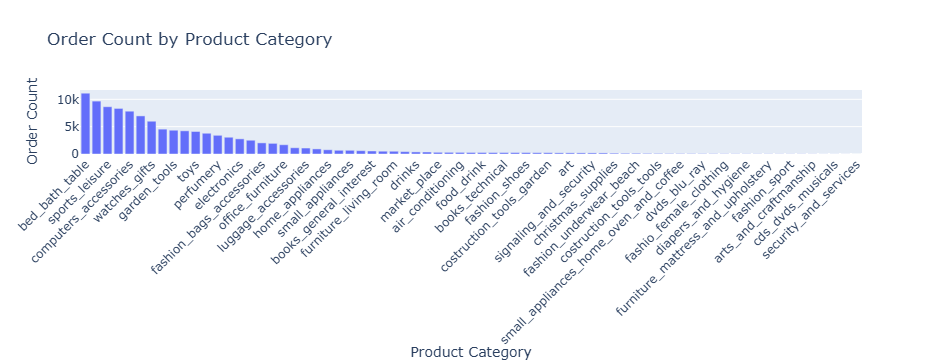

In [195]:
import plotly.express as px

fig = px.bar(
    x=products_category_order.index,
    y=products_category_order["order_count"],
    title="Order Count by Product Category",
    labels={"x": "Product Category", "y": "Order Count"}
)

fig.update_layout(
    xaxis={
        "tickangle": -45
    }
)

fig.show()

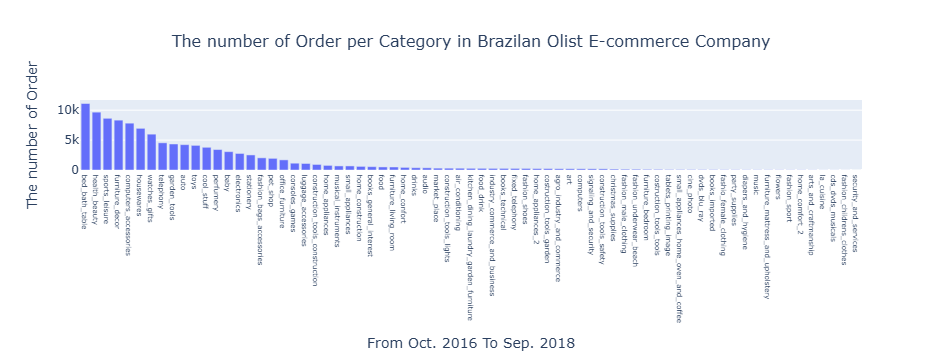

In [198]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=products_category_order.index,
        y=products_category_order["order_count"]
    )
)

fig.update_layout(
    {
        # "title": "<b>Heatmap (Plotly Graph Objects)</b>"
        "title": {
            "text": "The number of Order per Category in Brazilan Olist E-commerce Company",
             "x": 0.5,
             "y": 0.9,
             "font" : {
                 "size" : 16
             }
        },
        "xaxis": {
             "title": "From Oct. 2016 To Sep. 2018",
             "showticklabels":True,
             "tickfont" : {
                 "size" : 7
             }
        },
        "yaxis" : {
             "title" : "The number of Order"
        }
    }
)


fig.show()

In [200]:
products_category_order[products_category_order["order_count"] > 1000]

,order_count
product_category_name_english,
bed_bath_table,11115
health_beauty,9670
sports_leisure,8641
furniture_decor,8334
computers_accessories,7827
housewares,6964
watches_gifts,5991
telephony,4545
garden_tools,4347


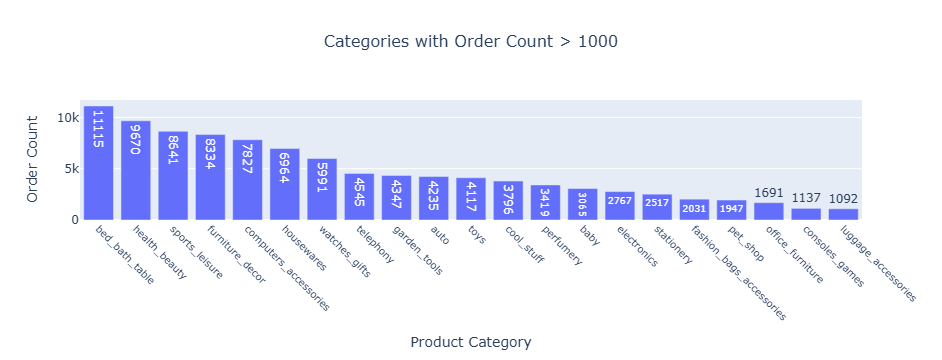

In [203]:
import plotly.graph_objects as go

# order_count > 1000 필터링
filtered_df = products_category_order[products_category_order["order_count"] > 1000]

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=filtered_df.index,
        y=filtered_df["order_count"],
        text=filtered_df["order_count"],
        texttemplate='%{text}',
        textposition='auto'
    )
)

fig.update_layout(
    title={
        "text": "Categories with Order Count > 1000",
        "x": 0.5,
        "y": 0.9,
        "font": {"size": 16}
    },
    xaxis={
        "title": "Product Category",
        "tickangle": 45,
        "tickfont": {"size": 10}
    },
    yaxis={
        "title": "Order Count"
    }
)

fig.show()


1. 얼마나 많은 고객을 확보하고 있는가?
2. 고객들이 어디에 주로 거주하고 있는가?
3. 고객은 주로 어떤 결제방법을 사용하고 있는가?
4. 평균거래액은 얼마나 되는가?
5. 일별, 주별, 월별 판매 트렌드는 어떻게 되는가?
6. 어떤 카테고리가 인기가 있을까?
7. 평균배송시간은 얼마나될까?

In [204]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [206]:
orders.shape   # 중복값 있을 수 있음

(99441, 8)

In [207]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [208]:
orders.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [209]:
orders = orders.dropna()

In [210]:
orders.isnull().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
dtype: int64

In [214]:
orders["delivery_time"] = pd.to_datetime(orders["order_delivered_customer_date"]) - pd.to_datetime(orders["order_purchase_timestamp"])

In [215]:
orders_new=orders.copy()

In [216]:
orders_new["delivery_time"] = pd.to_datetime(orders_new["order_delivered_customer_date"]) - pd.to_datetime(orders_new["order_purchase_timestamp"])

In [217]:
orders_new

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,8 days 10:28:40
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,13 days 18:46:08
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,9 days 09:27:40
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,13 days 05:00:36
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,2 days 20:58:23
...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00,8 days 05:13:56
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00,22 days 04:38:58
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00,24 days 20:37:34
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00,17 days 02:04:27


In [219]:
orders_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96461 entries, 0 to 99440
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype          
---  ------                         --------------  -----          
 0   order_id                       96461 non-null  object         
 1   customer_id                    96461 non-null  object         
 2   order_status                   96461 non-null  object         
 3   order_purchase_timestamp       96461 non-null  object         
 4   order_approved_at              96461 non-null  object         
 5   order_delivered_carrier_date   96461 non-null  object         
 6   order_delivered_customer_date  96461 non-null  object         
 7   order_estimated_delivery_date  96461 non-null  object         
 8   delivery_time                  96461 non-null  timedelta64[ns]
dtypes: object(8), timedelta64[ns](1)
memory usage: 7.4+ MB


In [221]:
orders_new["delivery_time"].describe()

count                         96461
mean     12 days 13:23:46.585853350
std       9 days 13:06:45.121880865
min                 0 days 12:48:07
25%                 6 days 18:22:50
50%                10 days 05:11:29
75%                15 days 17:17:10
max               209 days 15:05:12
Name: delivery_time, dtype: object

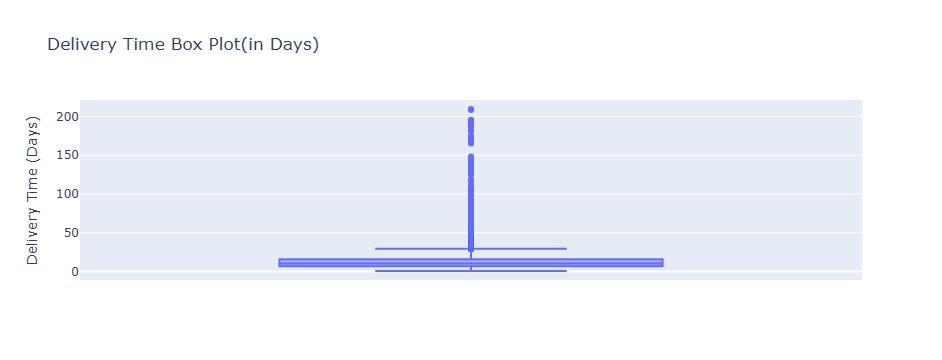

In [229]:
import plotly.express as px

orders_new["delivery_time_days"] = orders_new["delivery_time"].dt.total_seconds()/86400

fig = px.box(
    orders_new,
    y="delivery_time_days",
    title="Delivery Time Box Plot(in Days)",
    labels={"delivery_time_days": "Delivery Time (Days)"}
)

fig.show()

In [225]:
orders_new

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time,delivery_time_days
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,8 days 10:28:40,8.436574
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,13 days 18:46:08,13.782037
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,9 days 09:27:40,9.394213
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,13 days 05:00:36,13.208750
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,2 days 20:58:23,2.873877
...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00,8 days 05:13:56,8.218009
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00,22 days 04:38:58,22.193727
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00,24 days 20:37:34,24.859421
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00,17 days 02:04:27,17.086424


In [231]:
# quantile() : 특정 데이터 내 원하는 값만 쪼개서 확인할 수 있도록 도와주는 함수

delivery_time_q95 = orders_new["delivery_time"].quantile(0.95)

In [232]:
delivery_time_q95

Timedelta('29 days 06:36:33')

In [234]:
delivery_time_q90 = orders_new["delivery_time"].quantile(0.90)

In [235]:
delivery_time_q90

Timedelta('23 days 02:21:07')

In [238]:
orders_new = orders_new[orders_new["delivery_time"] < delivery_time_q95]

In [239]:
orders_new

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time,delivery_time_days
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,8 days 10:28:40,8.436574
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,13 days 18:46:08,13.782037
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,9 days 09:27:40,9.394213
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,13 days 05:00:36,13.208750
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,2 days 20:58:23,2.873877
...,...,...,...,...,...,...,...,...,...,...
99435,880675dff2150932f1601e1c07eadeeb,47cd45a6ac7b9fb16537df2ccffeb5ac,delivered,2017-02-23 09:05:12,2017-02-23 09:15:11,2017-03-01 10:22:52,2017-03-06 11:08:08,2017-03-22 00:00:00,11 days 02:02:56,11.085370
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00,8 days 05:13:56,8.218009
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00,22 days 04:38:58,22.193727
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00,17 days 02:04:27,17.086424


In [273]:
orders_date = orders_new[["order_purchase_timestamp","delivery_time"]].copy()
orders_date["order_purchase_timestamp"] = pd.to_datetime(orders_date["order_purchase_timestamp"], format="%Y-%m-%d %H:%M:%S", errors="raise")
orders_date["delivery_time"] = orders_date["delivery_time"].dt.total_seconds()
orders_date = orders_date.set_index("order_purchase_timestamp")

In [274]:
orders_date.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 86814 entries, 2017-10-02 10:56:33 to 2018-03-08 20:57:30
Data columns (total 1 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   delivery_time  86814 non-null  float64
dtypes: float64(1)
memory usage: 1.3 MB


In [275]:
orders_date = orders_date.groupby(pd.Grouper(freq="ME")).mean()

In [276]:
orders_date

,delivery_time
order_purchase_timestamp,
2016-10-31,1.141415e+06
2016-11-30,NaN
2016-12-31,4.054770e+05
2017-01-31,9.291109e+05
2017-02-28,9.497493e+05
2017-03-31,9.029050e+05
2017-04-30,1.038134e+06
2017-05-31,8.846769e+05
2017-06-30,9.249833e+05


In [260]:
# 지수표기법 explonation : 부동 소수점을 가지고 있는 실수자료형에서 많이 사용하는 표기법 
# 1. 1.25665786548 (*정수부 > 실수부)
# 숫자 비율 ,크기 -> 실수부 < 정수부
# 제곱 -> 밑 / 지수 2^3

# 6.626825e+05 => 6.626825 X 10^5 (10000)

# 부호부 (1비트) x 값 x 지수부 (8bit)

In [277]:
orders_date["delivery_time"]=orders_date["delivery_time"]/86400

In [262]:
orders_date

,delivery_time
order_purchase_timestamp,
2016-10-31,13.210816
2016-11-30,NaN
2016-12-31,4.693021
2017-01-31,10.753599
2017-02-28,10.992469
2017-03-31,10.450289
2017-04-30,12.015435
2017-05-31,10.239316
2017-06-30,10.705825


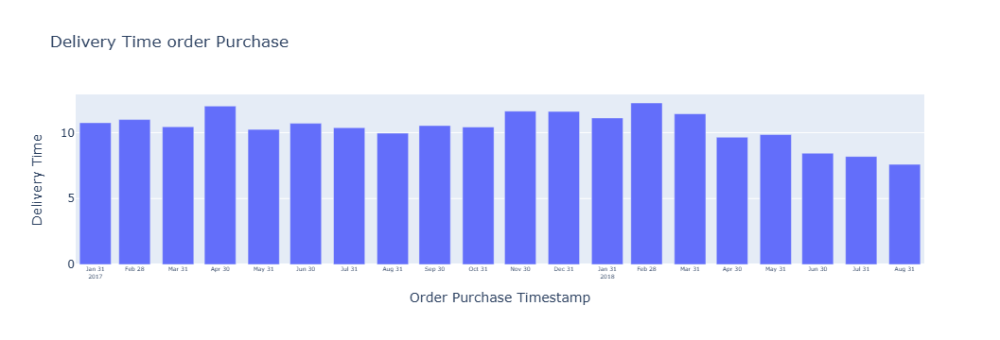

In [285]:
import plotly.express as px


fig = px.bar(
    x= orders_date.index,
    y=orders_date["delivery_time"],
    title="Delivery Time order Purchase",
    labels={"x" : "Order Purchase Timestamp", "y": "Delivery Time"}
)

fig.update_layout(
    xaxis={
        "showticklabels" : True,
        "dtick" : "M1",
        "tick0" : "2017-01-31",
        "tickfont" : {
            "size" : 6
        }
    }
)

fig.show()

In [279]:
orders_date = orders_date[orders_date.index > "2017-01-01"]

In [288]:
colors=["#1b80bf"] * len(orders_date.index)
for index in range(15, len(orders_date.index)) :
    colors[index] = "#bf2c47"

In [289]:
colors

['#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#1b80bf',
 '#bf2c47',
 '#bf2c47',
 '#bf2c47',
 '#bf2c47',
 '#bf2c47']

In [302]:
import plotly.graph_objects as go

filtered_df = products_category_order[products_category_order["order_count"] > 1000]

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=orders_date.index,
        y=orders_date["delivery_time"],
        text=orders_date["delivery_time"],
        texttemplate='%{text:.2f} days'
    )
)

fig.update_layout(
    title={
        "text": "<b>Average Delivery Time Per Mounth in Brazilian Olist E-Commerce  Company</b>",
        "x": 0.5,
        "y": 0.9,
        "font": {"size": 14}
    },
    xaxis={
        "title": "From Jan, 2017 To Aug 2018",
        "showticklabels": True,
        "tick0": "2017-01-31",
        "dtick" : "M1",
        "tickfont" : {
            "size" : 6
        }
    },
    yaxis={
        "title": "Delivery Time (Days)",
        "template" : "plotly_white"
    }
)

fig.add_annotation(
    x = "2018-04-30",
    y = 10.4,
    text = "<b>Improved Logistics</b>",
    showarrow = True,
    font ={
        "size" : 10,
        "color" : "#fff"
    },
    align = "center",
    arrowhead=2,
    arrowwidth =2,
    arrowsize=1,
    arrowcolor="#77bdd9",
    bordercolor="#77bdd9",
    borderwidth=2,
    borderpad=4,
    bgcolor="#f22e62",
    ax=40,
    ay=30,
    opacity = 0.8
)

fig.show()


ValueError: Invalid property specified for object of type plotly.graph_objs.layout.YAxis: 'template'

Did you mean "title"?

    Valid properties:
        anchor
            If set to an opposite-letter axis id (e.g. `x2`, `y`),
            this axis is bound to the corresponding opposite-letter
            axis. If set to "free", this axis' position is
            determined by `position`.
        automargin
            Determines whether long tick labels automatically grow
            the figure margins.
        autorange
            Determines whether or not the range of this axis is
            computed in relation to the input data. See `rangemode`
            for more info. If `range` is provided and it has a
            value for both the lower and upper bound, `autorange`
            is set to False. Using "min" applies autorange only to
            set the minimum. Using "max" applies autorange only to
            set the maximum. Using *min reversed* applies autorange
            only to set the minimum on a reversed axis. Using *max
            reversed* applies autorange only to set the maximum on
            a reversed axis. Using "reversed" applies autorange on
            both ends and reverses the axis direction.
        autorangeoptions
            :class:`plotly.graph_objects.layout.yaxis.Autorangeopti
            ons` instance or dict with compatible properties
        autoshift
            Automatically reposition the axis to avoid overlap with
            other axes with the same `overlaying` value. This
            repositioning will account for any `shift` amount
            applied to other axes on the same side with `autoshift`
            is set to true. Only has an effect if `anchor` is set
            to "free".
        autotickangles
            When `tickangle` is set to "auto", it will be set to
            the first angle in this array that is large enough to
            prevent label overlap.
        autotypenumbers
            Using "strict" a numeric string in trace data is not
            converted to a number. Using *convert types* a numeric
            string in trace data may be treated as a number during
            automatic axis `type` detection. Defaults to
            layout.autotypenumbers.
        calendar
            Sets the calendar system to use for `range` and `tick0`
            if this is a date axis. This does not set the calendar
            for interpreting data on this axis, that's specified in
            the trace or via the global `layout.calendar`
        categoryarray
            Sets the order in which categories on this axis appear.
            Only has an effect if `categoryorder` is set to
            "array". Used with `categoryorder`.
        categoryarraysrc
            Sets the source reference on Chart Studio Cloud for
            `categoryarray`.
        categoryorder
            Specifies the ordering logic for the case of
            categorical variables. By default, plotly uses "trace",
            which specifies the order that is present in the data
            supplied. Set `categoryorder` to *category ascending*
            or *category descending* if order should be determined
            by the alphanumerical order of the category names. Set
            `categoryorder` to "array" to derive the ordering from
            the attribute `categoryarray`. If a category is not
            found in the `categoryarray` array, the sorting
            behavior for that attribute will be identical to the
            "trace" mode. The unspecified categories will follow
            the categories in `categoryarray`. Set `categoryorder`
            to *total ascending* or *total descending* if order
            should be determined by the numerical order of the
            values. Similarly, the order can be determined by the
            min, max, sum, mean, geometric mean or median of all
            the values.
        color
            Sets default for all colors associated with this axis
            all at once: line, font, tick, and grid colors. Grid
            color is lightened by blending this with the plot
            background Individual pieces can override this.
        constrain
            If this axis needs to be compressed (either due to its
            own `scaleanchor` and `scaleratio` or those of the
            other axis), determines how that happens: by increasing
            the "range", or by decreasing the "domain". Default is
            "domain" for axes containing image traces, "range"
            otherwise.
        constraintoward
            If this axis needs to be compressed (either due to its
            own `scaleanchor` and `scaleratio` or those of the
            other axis), determines which direction we push the
            originally specified plot area. Options are "left",
            "center" (default), and "right" for x axes, and "top",
            "middle" (default), and "bottom" for y axes.
        dividercolor
            Sets the color of the dividers Only has an effect on
            "multicategory" axes.
        dividerwidth
            Sets the width (in px) of the dividers Only has an
            effect on "multicategory" axes.
        domain
            Sets the domain of this axis (in plot fraction).
        dtick
            Sets the step in-between ticks on this axis. Use with
            `tick0`. Must be a positive number, or special strings
            available to "log" and "date" axes. If the axis `type`
            is "log", then ticks are set every 10^(n*dtick) where n
            is the tick number. For example, to set a tick mark at
            1, 10, 100, 1000, ... set dtick to 1. To set tick marks
            at 1, 100, 10000, ... set dtick to 2. To set tick marks
            at 1, 5, 25, 125, 625, 3125, ... set dtick to
            log_10(5), or 0.69897000433. "log" has several special
            values; "L<f>", where `f` is a positive number, gives
            ticks linearly spaced in value (but not position). For
            example `tick0` = 0.1, `dtick` = "L0.5" will put ticks
            at 0.1, 0.6, 1.1, 1.6 etc. To show powers of 10 plus
            small digits between, use "D1" (all digits) or "D2"
            (only 2 and 5). `tick0` is ignored for "D1" and "D2".
            If the axis `type` is "date", then you must convert the
            time to milliseconds. For example, to set the interval
            between ticks to one day, set `dtick` to 86400000.0.
            "date" also has special values "M<n>" gives ticks
            spaced by a number of months. `n` must be a positive
            integer. To set ticks on the 15th of every third month,
            set `tick0` to "2000-01-15" and `dtick` to "M3". To set
            ticks every 4 years, set `dtick` to "M48"
        exponentformat
            Determines a formatting rule for the tick exponents.
            For example, consider the number 1,000,000,000. If
            "none", it appears as 1,000,000,000. If "e", 1e+9. If
            "E", 1E+9. If "power", 1x10^9 (with 9 in a super
            script). If "SI", 1G. If "B", 1B.
        fixedrange
            Determines whether or not this axis is zoom-able. If
            true, then zoom is disabled.
        gridcolor
            Sets the color of the grid lines.
        griddash
            Sets the dash style of lines. Set to a dash type string
            ("solid", "dot", "dash", "longdash", "dashdot", or
            "longdashdot") or a dash length list in px (eg
            "5px,10px,2px,2px").
        gridwidth
            Sets the width (in px) of the grid lines.
        hoverformat
            Sets the hover text formatting rule using d3 formatting
            mini-languages which are very similar to those in
            Python. For numbers, see:
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format.
            And for dates see: https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format. We add two items to
            d3's date formatter: "%h" for half of the year as a
            decimal number as well as "%{n}f" for fractional
            seconds with n digits. For example, *2016-10-13
            09:15:23.456* with tickformat "%H~%M~%S.%2f" would
            display "09~15~23.46"
        insiderange
            Could be used to set the desired inside range of this
            axis (excluding the labels) when `ticklabelposition` of
            the anchored axis has "inside". Not implemented for
            axes with `type` "log". This would be ignored when
            `range` is provided.
        labelalias
            Replacement text for specific tick or hover labels. For
            example using {US: 'USA', CA: 'Canada'} changes US to
            USA and CA to Canada. The labels we would have shown
            must match the keys exactly, after adding any
            tickprefix or ticksuffix. For negative numbers the
            minus sign symbol used (U+2212) is wider than the
            regular ascii dash. That means you need to use −1
            instead of -1. labelalias can be used with any axis
            type, and both keys (if needed) and values (if desired)
            can include html-like tags or MathJax.
        layer
            Sets the layer on which this axis is displayed. If
            *above traces*, this axis is displayed above all the
            subplot's traces If *below traces*, this axis is
            displayed below all the subplot's traces, but above the
            grid lines. Useful when used together with scatter-like
            traces with `cliponaxis` set to False to show markers
            and/or text nodes above this axis.
        linecolor
            Sets the axis line color.
        linewidth
            Sets the width (in px) of the axis line.
        matches
            If set to another axis id (e.g. `x2`, `y`), the range
            of this axis will match the range of the corresponding
            axis in data-coordinates space. Moreover, matching axes
            share auto-range values, category lists and histogram
            auto-bins. Note that setting axes simultaneously in
            both a `scaleanchor` and a `matches` constraint is
            currently forbidden. Moreover, note that matching axes
            must have the same `type`.
        maxallowed
            Determines the maximum range of this axis.
        minallowed
            Determines the minimum range of this axis.
        minexponent
            Hide SI prefix for 10^n if |n| is below this number.
            This only has an effect when `tickformat` is "SI" or
            "B".
        minor
            :class:`plotly.graph_objects.layout.yaxis.Minor`
            instance or dict with compatible properties
        mirror
            Determines if the axis lines or/and ticks are mirrored
            to the opposite side of the plotting area. If True, the
            axis lines are mirrored. If "ticks", the axis lines and
            ticks are mirrored. If False, mirroring is disable. If
            "all", axis lines are mirrored on all shared-axes
            subplots. If "allticks", axis lines and ticks are
            mirrored on all shared-axes subplots.
        nticks
            Specifies the maximum number of ticks for the
            particular axis. The actual number of ticks will be
            chosen automatically to be less than or equal to
            `nticks`. Has an effect only if `tickmode` is set to
            "auto".
        overlaying
            If set a same-letter axis id, this axis is overlaid on
            top of the corresponding same-letter axis, with traces
            and axes visible for both axes. If False, this axis
            does not overlay any same-letter axes. In this case,
            for axes with overlapping domains only the highest-
            numbered axis will be visible.
        position
            Sets the position of this axis in the plotting space
            (in normalized coordinates). Only has an effect if
            `anchor` is set to "free".
        range
            Sets the range of this axis. If the axis `type` is
            "log", then you must take the log of your desired range
            (e.g. to set the range from 1 to 100, set the range
            from 0 to 2). If the axis `type` is "date", it should
            be date strings, like date data, though Date objects
            and unix milliseconds will be accepted and converted to
            strings. If the axis `type` is "category", it should be
            numbers, using the scale where each category is
            assigned a serial number from zero in the order it
            appears. Leaving either or both elements `null` impacts
            the default `autorange`.
        rangebreaks
            A tuple of
            :class:`plotly.graph_objects.layout.yaxis.Rangebreak`
            instances or dicts with compatible properties
        rangebreakdefaults
            When used in a template (as
            layout.template.layout.yaxis.rangebreakdefaults), sets
            the default property values to use for elements of
            layout.yaxis.rangebreaks
        rangemode
            If "normal", the range is computed in relation to the
            extrema of the input data. If *tozero*`, the range
            extends to 0, regardless of the input data If
            "nonnegative", the range is non-negative, regardless of
            the input data. Applies only to linear axes.
        scaleanchor
            If set to another axis id (e.g. `x2`, `y`), the range
            of this axis changes together with the range of the
            corresponding axis such that the scale of pixels per
            unit is in a constant ratio. Both axes are still
            zoomable, but when you zoom one, the other will zoom
            the same amount, keeping a fixed midpoint. `constrain`
            and `constraintoward` determine how we enforce the
            constraint. You can chain these, ie `yaxis:
            {scaleanchor: *x*}, xaxis2: {scaleanchor: *y*}` but you
            can only link axes of the same `type`. The linked axis
            can have the opposite letter (to constrain the aspect
            ratio) or the same letter (to match scales across
            subplots). Loops (`yaxis: {scaleanchor: *x*}, xaxis:
            {scaleanchor: *y*}` or longer) are redundant and the
            last constraint encountered will be ignored to avoid
            possible inconsistent constraints via `scaleratio`.
            Note that setting axes simultaneously in both a
            `scaleanchor` and a `matches` constraint is currently
            forbidden. Setting `false` allows to remove a default
            constraint (occasionally, you may need to prevent a
            default `scaleanchor` constraint from being applied,
            eg. when having an image trace `yaxis: {scaleanchor:
            "x"}` is set automatically in order for pixels to be
            rendered as squares, setting `yaxis: {scaleanchor:
            false}` allows to remove the constraint).
        scaleratio
            If this axis is linked to another by `scaleanchor`,
            this determines the pixel to unit scale ratio. For
            example, if this value is 10, then every unit on this
            axis spans 10 times the number of pixels as a unit on
            the linked axis. Use this for example to create an
            elevation profile where the vertical scale is
            exaggerated a fixed amount with respect to the
            horizontal.
        separatethousands
            If "true", even 4-digit integers are separated
        shift
            Moves the axis a given number of pixels from where it
            would have been otherwise. Accepts both positive and
            negative values, which will shift the axis either right
            or left, respectively. If `autoshift` is set to true,
            then this defaults to a padding of -3 if `side` is set
            to "left". and defaults to +3 if `side` is set to
            "right". Defaults to 0 if `autoshift` is set to false.
            Only has an effect if `anchor` is set to "free".
        showdividers
            Determines whether or not a dividers are drawn between
            the category levels of this axis. Only has an effect on
            "multicategory" axes.
        showexponent
            If "all", all exponents are shown besides their
            significands. If "first", only the exponent of the
            first tick is shown. If "last", only the exponent of
            the last tick is shown. If "none", no exponents appear.
        showgrid
            Determines whether or not grid lines are drawn. If
            True, the grid lines are drawn at every tick mark.
        showline
            Determines whether or not a line bounding this axis is
            drawn.
        showspikes
            Determines whether or not spikes (aka droplines) are
            drawn for this axis. Note: This only takes affect when
            hovermode = closest
        showticklabels
            Determines whether or not the tick labels are drawn.
        showtickprefix
            If "all", all tick labels are displayed with a prefix.
            If "first", only the first tick is displayed with a
            prefix. If "last", only the last tick is displayed with
            a suffix. If "none", tick prefixes are hidden.
        showticksuffix
            Same as `showtickprefix` but for tick suffixes.
        side
            Determines whether a x (y) axis is positioned at the
            "bottom" ("left") or "top" ("right") of the plotting
            area.
        spikecolor
            Sets the spike color. If undefined, will use the series
            color
        spikedash
            Sets the dash style of lines. Set to a dash type string
            ("solid", "dot", "dash", "longdash", "dashdot", or
            "longdashdot") or a dash length list in px (eg
            "5px,10px,2px,2px").
        spikemode
            Determines the drawing mode for the spike line If
            "toaxis", the line is drawn from the data point to the
            axis the  series is plotted on. If "across", the line
            is drawn across the entire plot area, and supercedes
            "toaxis". If "marker", then a marker dot is drawn on
            the axis the series is plotted on
        spikesnap
            Determines whether spikelines are stuck to the cursor
            or to the closest datapoints.
        spikethickness
            Sets the width (in px) of the zero line.
        tick0
            Sets the placement of the first tick on this axis. Use
            with `dtick`. If the axis `type` is "log", then you
            must take the log of your starting tick (e.g. to set
            the starting tick to 100, set the `tick0` to 2) except
            when `dtick`=*L<f>* (see `dtick` for more info). If the
            axis `type` is "date", it should be a date string, like
            date data. If the axis `type` is "category", it should
            be a number, using the scale where each category is
            assigned a serial number from zero in the order it
            appears.
        tickangle
            Sets the angle of the tick labels with respect to the
            horizontal. For example, a `tickangle` of -90 draws the
            tick labels vertically.
        tickcolor
            Sets the tick color.
        tickfont
            Sets the tick font.
        tickformat
            Sets the tick label formatting rule using d3 formatting
            mini-languages which are very similar to those in
            Python. For numbers, see:
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format.
            And for dates see: https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format. We add two items to
            d3's date formatter: "%h" for half of the year as a
            decimal number as well as "%{n}f" for fractional
            seconds with n digits. For example, *2016-10-13
            09:15:23.456* with tickformat "%H~%M~%S.%2f" would
            display "09~15~23.46"
        tickformatstops
            A tuple of :class:`plotly.graph_objects.layout.yaxis.Ti
            ckformatstop` instances or dicts with compatible
            properties
        tickformatstopdefaults
            When used in a template (as
            layout.template.layout.yaxis.tickformatstopdefaults),
            sets the default property values to use for elements of
            layout.yaxis.tickformatstops
        ticklabelindex
            Only for axes with `type` "date" or "linear". Instead
            of drawing the major tick label, draw the label for the
            minor tick that is n positions away from the major
            tick. E.g. to always draw the label for the minor tick
            before each major tick, choose `ticklabelindex` -1.
            This is useful for date axes with `ticklabelmode`
            "period" if you want to label the period that ends with
            each major tick instead of the period that begins
            there.
        ticklabelindexsrc
            Sets the source reference on Chart Studio Cloud for
            `ticklabelindex`.
        ticklabelmode
            Determines where tick labels are drawn with respect to
            their corresponding ticks and grid lines. Only has an
            effect for axes of `type` "date" When set to "period",
            tick labels are drawn in the middle of the period
            between ticks.
        ticklabeloverflow
            Determines how we handle tick labels that would
            overflow either the graph div or the domain of the
            axis. The default value for inside tick labels is *hide
            past domain*. Otherwise on "category" and
            "multicategory" axes the default is "allow". In other
            cases the default is *hide past div*.
        ticklabelposition
            Determines where tick labels are drawn with respect to
            the axis Please note that top or bottom has no effect
            on x axes or when `ticklabelmode` is set to "period".
            Similarly left or right has no effect on y axes or when
            `ticklabelmode` is set to "period". Has no effect on
            "multicategory" axes or when `tickson` is set to
            "boundaries". When used on axes linked by `matches` or
            `scaleanchor`, no extra padding for inside labels would
            be added by autorange, so that the scales could match.
        ticklabelshift
            Shifts the tick labels by the specified number of
            pixels in parallel to the axis. Positive values move
            the labels in the positive direction of the axis.
        ticklabelstandoff
            Sets the standoff distance (in px) between the axis
            tick labels and their default position. A positive
            `ticklabelstandoff` moves the labels farther away from
            the plot area if `ticklabelposition` is "outside", and
            deeper into the plot area if `ticklabelposition` is
            "inside". A negative `ticklabelstandoff` works in the
            opposite direction, moving outside ticks towards the
            plot area and inside ticks towards the outside. If the
            negative value is large enough, inside ticks can even
            end up outside and vice versa.
        ticklabelstep
            Sets the spacing between tick labels as compared to the
            spacing between ticks. A value of 1 (default) means
            each tick gets a label. A value of 2 means shows every
            2nd label. A larger value n means only every nth tick
            is labeled. `tick0` determines which labels are shown.
            Not implemented for axes with `type` "log" or
            "multicategory", or when `tickmode` is "array".
        ticklen
            Sets the tick length (in px).
        tickmode
            Sets the tick mode for this axis. If "auto", the number
            of ticks is set via `nticks`. If "linear", the
            placement of the ticks is determined by a starting
            position `tick0` and a tick step `dtick` ("linear" is
            the default value if `tick0` and `dtick` are provided).
            If "array", the placement of the ticks is set via
            `tickvals` and the tick text is `ticktext`. ("array" is
            the default value if `tickvals` is provided). If
            "sync", the number of ticks will sync with the
            overlayed axis set by `overlaying` property.
        tickprefix
            Sets a tick label prefix.
        ticks
            Determines whether ticks are drawn or not. If "", this
            axis' ticks are not drawn. If "outside" ("inside"),
            this axis' are drawn outside (inside) the axis lines.
        tickson
            Determines where ticks and grid lines are drawn with
            respect to their corresponding tick labels. Only has an
            effect for axes of `type` "category" or
            "multicategory". When set to "boundaries", ticks and
            grid lines are drawn half a category to the left/bottom
            of labels.
        ticksuffix
            Sets a tick label suffix.
        ticktext
            Sets the text displayed at the ticks position via
            `tickvals`. Only has an effect if `tickmode` is set to
            "array". Used with `tickvals`.
        ticktextsrc
            Sets the source reference on Chart Studio Cloud for
            `ticktext`.
        tickvals
            Sets the values at which ticks on this axis appear.
            Only has an effect if `tickmode` is set to "array".
            Used with `ticktext`.
        tickvalssrc
            Sets the source reference on Chart Studio Cloud for
            `tickvals`.
        tickwidth
            Sets the tick width (in px).
        title
            :class:`plotly.graph_objects.layout.yaxis.Title`
            instance or dict with compatible properties
        titlefont
            Deprecated: Please use layout.yaxis.title.font instead.
            Sets this axis' title font. Note that the title's font
            used to be customized by the now deprecated `titlefont`
            attribute.
        type
            Sets the axis type. By default, plotly attempts to
            determined the axis type by looking into the data of
            the traces that referenced the axis in question.
        uirevision
            Controls persistence of user-driven changes in axis
            `range`, `autorange`, and `title` if in `editable:
            true` configuration. Defaults to `layout.uirevision`.
        visible
            A single toggle to hide the axis while preserving
            interaction like dragging. Default is true when a
            cheater plot is present on the axis, otherwise false
        zeroline
            Determines whether or not a line is drawn at along the
            0 value of this axis. If True, the zero line is drawn
            on top of the grid lines.
        zerolinecolor
            Sets the line color of the zero line.
        zerolinewidth
            Sets the width (in px) of the zero line.
        
Did you mean "title"?

Bad property path:
template
^^^^^^^^

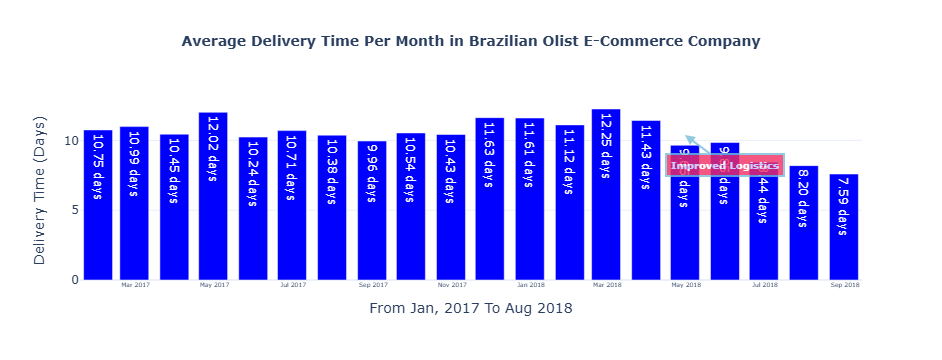

In [311]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=orders_date.index,
        y=orders_date["delivery_time"],
        text=[f"{v:.2f} days" for v in orders_date["delivery_time"]],
        textposition='auto',
        marker_color='blue'
    )
)

fig.update_layout(
    title={
        "text": "<b>Average Delivery Time Per Month in Brazilian Olist E-Commerce Company</b>",
        "x": 0.5,
        "y": 0.9,
        "font": {"size": 14}
    },
    xaxis={
        "title": "From Jan, 2017 To Aug 2018",
        "showticklabels": True,
        # tick0, dtick 빼고 시도해보세요
        "tickfont": {"size": 6}
    },
    yaxis={
        "title": "Delivery Time (Days)"
    },
    template="plotly_white"  # 전체 레이아웃에 적용
)

fig.add_annotation(
    x="2018-04-30",
    y=10.4,
    text="<b>Improved Logistics</b>",
    showarrow=True,
    font={"size": 10, "color": "#fff"},
    align="center",
    arrowhead=2,
    arrowwidth=2,
    arrowsize=1,
    arrowcolor="#77bdd9",
    bordercolor="#77bdd9",
    borderwidth=2,
    borderpad=4,
    bgcolor="#f22e62",
    ax=40,
    ay=30,
    opacity=0.8
)

fig.show()
